# Package imports

In [2]:
# The numerical integrators are located in a module two levels above
# the current working directory. Hence:
import sys
sys.path.insert(0, '../..')

In [3]:
# Importing required packages:

# Numpy
import numpy as np

# Matplotlib
from matplotlib import pyplot as plt
plt.rc('text',usetex=True)
plt.rc('figure',figsize=(18,10),dpi=100)
%matplotlib inline

# Numba (JiT)
from numba import jit

# (Primitive) timing functionality
import time 

# Multiprocessing:
import multiprocessing as mp

# Spline interpolation:
from scipy.interpolate import RectBivariateSpline

# Check whether folders exist or not, necessary
# for storing advected states:
import os
import errno

# Display progress bars:
from ipywidgets import FloatProgress
from IPython.display import display

# Deep copies
import copy

## Function which enables us to create directories if they don't exist:

In [4]:
# Function that makes a directory if it does not exist,
# and raises an exception otherwise 
# (necessary for storing advected states)

def ensure_path_exists(path):
    try:
        os.makedirs(path)
    except OSError as exception:
        if exception.errno != errno.EEXIST:
            raise

# Defining the velocity field:

In [5]:
@jit(nopython=True)
def doublegyre_wrapper(t,x):
    # Parameters of the velocity field (Cf. Farazmand & Haller, 2012)
    # A
    A = 0.1
    # epsilon
    e = 0.1
    # omega
    w = 2*np.pi/10
    return _doublegyre(t,x,A,e,w)

@jit(nopython=True)
def _doublegyre(t,x,A,e,w):
    # a(t)
    a = e * np.sin(w*t)       
    # b(t)
    b = 1 - 2*e*np.sin(w*t)  
    # f(x,t)
    f = a*x[0,:]**2 + b*x[0,:]
    # df/dx
    dfdx = 2*a*x[0,:] + b
    
    v = np.empty(x.shape)                         
    # x-component:
    v[0,:] = -np.pi*A*np.sin(np.pi*f)*np.cos(np.pi*x[1,:])
    # y-component:
    v[1,:] = np.pi*A*np.cos(np.pi*f)*np.sin(np.pi*x[1,:])*dfdx
    return v 

# Functions generating grids of particles

In [6]:
def grid_of_particles(nx,ny,x_min,x_max,y_min,y_max):
    x = np.linspace(x_min,x_max,nx)
    y = np.linspace(y_min,y_max,ny)
    
    grid = np.empty((2,nx*ny))
    
    for j in xrange(n_x):
        grid[0,j*ny:(j+1)*ny] = x[j]
        grid[1,j*ny:(j+1)*ny] = y
        
    return grid

def padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max):
    x_0,dx = np.linspace(x_min,x_max,nx,retstep=True)
    y_0,dy = np.linspace(y_min,y_max,ny,retstep=True)
    
    x = np.empty(nx+4)
    x[0:2] = -2*dx, -dx
    x[2:-2] = x_0
    x[-2:] = x_max+dx, x_max+2*dx
    
    y = np.empty(ny+4)
    y[0:2] = -2*dy, -dy
    y[2:-2] = y_0
    y[-2:] = y_max+dy, y_max+2*dy
    
    nx_ = nx+4
    ny_ = ny+4
    
    grid = np.empty((2,nx_*ny_))
    
    for j in range(nx_):
        grid[0,j*ny_:(j+1)*ny_] = x[j]
        grid[1,j*ny_:(j+1)*ny_] = y
    
    return grid   

# List of implemented fixed step integrators
## Relevant for saving/loading advected states

In [7]:
fixed_step_integrators = set(['euler','rk2','rk3','rk4'])

In [8]:
%load_ext line_profiler

# Function which advects a set of initial conditions, including auxiliary grid points

In [9]:
# Input: (numpy) array of coordinates, shape: (5,2,nx*ny), [grid,x,y]
def endpoints(t_start,t_end,pos_start,stride,integrator,rhs,n_proc,atol,rtol):
    pos_end = np.empty(pos_start.shape)
    
    n_tot = pos_start.shape[2]
    part = np.floor(n_tot/n_proc).astype(int)
    
    qlist = [mp.Queue() for j in range(n_proc)]
    
    if integrator.__name__ in fixed_step_integrators:
        plist = [mp.Process(target=_endpoints_fixed,
                           args=(t_start,t_end,pos_start[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part],
                                stride,integrator,rhs,j,qlist[j])) for j in range(n_proc)]
    else:
        plist = [mp.Process(target=_endpoints_adaptive,
                           args=(t_start,t_end,pos_start[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part],
                                stride,integrator,rhs,j,qlist[j],atol,rtol)) for j in range(n_proc)]
    
    for p in plist:
        p.start()
    for j, q in enumerate(qlist):
        pos_end[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part] = q.get()
    for p in plist:
        p.join()
    
    return pos_end

def _endpoints_fixed(t_start,t_end,pos_start,stride,integrator,rhs,pn,q):
    pos_fin = np.copy(pos_start)
    if t_end>t_start:
        for j in range(pos_fin.shape[0]):
            n_steps = np.ceil((t_end-t_start)/stride).astype(int)
            h = (t_end-t_start)/n_steps
            for i in range(n_steps):
                foo, pos_fin[j], bar = integrator(t_start+i*h, pos_fin[j], h, rhs)
            #t = np.copy(t_start).astype(np.float64)
            #h = np.copy(stride).astype(np.float64)
            #while t<t_end:
            #    h = np.minimum(h,t_end-t)
            #    t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs)
    else:
        for j in range(np.size(pos_fin,0)):
            n_steps = np.ceil((t_start-t_end)/stride).astype(int)
            h = -(t_start-t_end)/n_steps
            for i in range(n_steps):
                foo, pos_fin[j], bar = integrator(t_start+i*h, pos_fin[j], h, rhs)
            #t = np.copy(t_start).astype(float)
            #h = np.copy(stride).astype(float)
            #while t>t_end:
            #    h=np.sign(h)*np.minimum(np.abs(h),np.abs(t-t_end))
            #    t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs)
    q.put(pos_fin)
    
def _endpoints_adaptive(t_start,t_end,pos_start,stride,integrator,rhs,pn,q,atol,rtol):
    pos_fin = np.copy(pos_start)
    if t_end>t_start:
        for j in range(np.size(pos_fin,0)):
            t = np.ones(np.size(pos_fin[j]))*t_start
            h = np.ones(np.size(pos_fin[j]))*stride
            while np.any(t<t_end):
                h = np.minimum(h,t_end-t)
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs,atol,rtol)
    else:
        for j in range(np.size(pos_fin,0)):
            t = np.ones(np.size(pos_fin[j]))*t_start
            h = np.ones(np.size(pos_fin[j]))*stride
            while np.any(t>t_end):
                h = np.sign(h)*np.minimum(np.abs(h),np.abs(t-t_end))
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs,atol,rtol)
    q.put(pos_fin)

# Function which computes the characteristics for given grid parameters

In [10]:
def characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,integrator,stride,rhs,n_proc=4,atol=None,rtol=None):
    grid = padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max)
    dx_main = (x_max-x_min)/(nx-1)
    dy_main = (y_max-y_min)/(ny-1)
    
    dx_aux = np.minimum(1e-5,dx_main*1e-2)
    dy_aux = np.minimum(1e-5,dy_main*1e-2)
    
    lmbd1,lmbd2,lapl_lmbd2,xi1,xi2,lapl_xi2 = _characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,dx_main,dy_main,dx_aux,dy_aux,integrator,stride,rhs,n_proc,atol,rtol)
    
    return grid,lmbd1,lmbd2,lapl_lmbd2,xi1,xi2,lapl_xi2

def _characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,dx_main,dy_main,dx_aux,dy_aux,integrator,stride,rhs,n_proc,atol,rtol):
    if integrator.__name__ in fixed_step_integrators:
        try:
            grid = np.load('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_h={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,stride))
            print('Precomputed advection found! Advection not necessary!')
        except IOError:
            print('Precomputed advection not found! Advection necessary!')
            # Grid: Main -> Right -> Above -> Left -> Beneath
            grid = np.empty((5,2,(nx+4)*(ny+4)))
            grid[0] = padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max)
            grid[1] = grid[0]+np.array([dx_aux,0]).reshape(2,1)
            grid[2] = grid[0]+np.array([0,dy_aux]).reshape(2,1)
            grid[3] = grid[0]+np.array([-dx_aux,0]).reshape(2,1)
            grid[4] = grid[0]+np.array([0,-dy_aux]).reshape(2,1)
            
            grid = endpoints(t_start,t_end,grid,stride,integrator,rhs,n_proc,atol,rtol)
            np.save('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_h={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,stride),grid)
            print('Configuration now stored. Advection won\'t be necessary next time!')
    else:
        try:
            grid = np.load('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_atol={}_rtol={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,atol,rtol))
            print('Precomputed advection found! Advection not necessary!')
        except IOError:
            print('Precomputed advection not found! Advection necessary!')
            # Grid: Main -> Right -> Above -> Left -> Beneath
            grid = np.zeros((5,2,(nx+4)*(ny+4)))
            grid[0] = padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max)
            grid[1] = grid[0]+np.array([dx_aux,0]).reshape(2,1)
            grid[2] = grid[0]+np.array([0,dy_aux]).reshape(2,1)
            grid[3] = grid[0]+np.array([-dx_aux,0]).reshape(2,1)
            grid[4] = grid[0]+np.array([0,-dy_aux]).reshape(2,1)
            
            grid = endpoints(t_start,t_end,grid,stride,integrator,rhs,n_proc,atol,rtol)
            np.save('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_atol={}_rtol={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,atol,rtol),grid)
            print('Configuration now stored. Advection won\'t be necessary next time!')
            
    tens_main,tens_aux = _find_strain_tensors(grid,nx,ny,dx_main,dy_main,dx_aux,dy_aux)
    
    lmbd1,lmbd2,xi1,xi2 = _find_characteristics(tens_main,tens_aux)
    
    lapl_lmbd2,lapl_xi2 = _find_laplacians(lmbd2,xi2,nx,ny,dx_main,dy_main)
    
    return lmbd1,lmbd2,lapl_lmbd2,xi1,xi2,lapl_xi2

def _find_strain_tensors(grid,nx,ny,dx_main,dy_main,dx_aux,dy_aux):
    grid_main = grid[0].reshape((2,nx+4,ny+4))
    grid_right = grid[1].reshape((2,nx+4,ny+4))
    grid_top = grid[2].reshape((2,nx+4,ny+4))
    grid_left = grid[3].reshape((2,nx+4,ny+4))
    grid_btm = grid[4].reshape((2,nx+4,ny+4))
    
    # Declare Jacobians
    df_m = np.empty((2,2,nx+4,ny+4))
    df_a = np.empty((2,2,nx+4,ny+4))
    
    # Use centered differencing throughout for auxiliary Jacobian:
    df_a[0,0,:,:] = (grid_right[0]-grid_left[0])/(2*dx_aux)
    df_a[0,1,:,:] = (grid_top[0]-grid_btm[0])/(2*dy_aux)
    df_a[1,0,:,:] = (grid_right[1]-grid_left[1])/(2*dx_aux)
    df_a[1,1,:,:] = (grid_top[1]-grid_btm[1])/(2*dy_aux)
    
    # Use centered differencing where applicable for main Jacobian,
    # second order backwards/forwards difference otherwise
    df_m[0,0,1:-1,:] = (grid_main[0,2:,:]-grid_main[0,0:-2,:])/(2*dx_main)
    df_m[0,0,0,:] = (-3*grid_main[0,0,:]+4*grid_main[0,1,:]-2*grid_main[0,2,:])/(2*dx_main)
    df_m[0,0,-1,:] = (3*grid_main[0,-1,:]-4*grid_main[0,-2,:]+2*grid_main[0,-3,:])/(2*dx_main)
    
    df_m[0,1,:,1:-1] = (grid_main[0,:,2:]-grid_main[0,:,0:-2])/(2*dy_main)
    df_m[0,1,:,0] = (-3*grid_main[0,:,0]+4*grid_main[0,:,1]-2*grid_main[0,:,2])/(2*dy_main)
    df_m[0,1,:,-1] = (3*grid_main[0,:,-1]-4*grid_main[0,:,-2]+2*grid_main[0,:,-3])/(2*dy_main)
    
    df_m[1,0,1:-1,:] = (grid_main[1,2:,:]-grid_main[1,0:-2,:])/(2*dx_main)
    df_m[1,0,0,:] = (-3*grid_main[1,0,:]+4*grid_main[1,1,:]-2*grid_main[1,2,:])/(2*dx_main)
    df_m[1,0,-1,:] = (3*grid_main[1,-1,:]-4*grid_main[1,-2,:]+2*grid_main[1,-3,:])/(2*dx_main)
    
    df_m[1,1,:,1:-1] = (grid_main[1,:,2:]-grid_main[1,:,0:-2])/(2*dy_main)
    df_m[1,1,:,0] = (-3*grid_main[1,:,0]+4*grid_main[1,:,1]-2*grid_main[1,:,2])/(2*dy_main)
    df_m[1,1,:,-1] = (3*grid_main[1,:,-1]-4*grid_main[1,:,-2]+2*grid_main[1,:,-3])/(2*dy_main)
    
    # Reshape Jacobian arrays:
    df_a = df_a.reshape((2,2,(nx+4)*(ny+4)))
    df_m = df_m.reshape((2,2,(nx+4)*(ny+4)))
    
    # Declare strain tensors:
    c_m = np.empty(np.shape(df_m))
    c_a = np.empty(np.shape(df_a))
    
    # Explicitly calculate strain tensors:
    for j in range((nx+4)*(ny+4)):
        c_m[:,:,j] = np.dot(df_m[:,:,j].T,df_m[:,:,j])
        c_a[:,:,j] = np.dot(df_a[:,:,j].T,df_a[:,:,j])
        
    return c_m,c_a

def _find_characteristics(tens_main,tens_aux):
    lmbd1 = np.empty(np.size(tens_main,2))
    lmbd2 = np.empty(np.shape(lmbd1))
    xi1 = np.empty((2,np.size(tens_main,2)))
    xi2 = np.empty(np.shape(xi1))
    
    for j in range(np.size(lmbd1)):
        # Linalg.eigh returns eigenvalues and vectors
        # sorted by increasing magnitude of eigenvalues
        vals, foo = np.linalg.eigh(tens_main[:,:,j])
        bar, vecs = np.linalg.eigh(tens_aux[:,:,j])
        
        lmbd1[j] = vals[0]
        lmbd2[j] = vals[1]
        
        xi1[:,j] = vecs[:,0]
        xi2[:,j] = vecs[:,1]
    
    return lmbd1,lmbd2,xi1,xi2

def _find_laplacians(lmbd,xi,nx,ny,dx_main,dy_main):
    lmbd_ = lmbd.reshape((nx+4,ny+4))
    xi_ = xi.reshape((2,nx+4,ny+4))
    
    lapl_lmbd = np.empty(np.shape(lmbd_))
    lapl_xi = np.empty(np.shape(xi_))
    
    # First direction:
    # Use centered differencing for internal points
    lapl_lmbd[1:-1,:] = (lmbd_[2:,:]-2*lmbd_[1:-1,:]+lmbd_[0:-2,:])/(dx_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_lmbd[0,:] = (2*lmbd_[0,:]-5*lmbd_[1,:]+4*lmbd_[2,:]-lmbd_[3,:])/(dx_main**2)
    lapl_lmbd[-1,:] = (2*lmbd_[-1,:]-5*lmbd_[-2,:]+4*lmbd_[-3,:]-lmbd_[-4,:])/(dx_main**2)
    
    # Second direction:
    # Use centered differencing for internal points
    lapl_lmbd[:,1:-1] += (lmbd_[:,2:]-2*lmbd_[:,1:-1]+lmbd_[:,0:-2])/(dy_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_lmbd[:,0] += (2*lmbd_[:,0]-5*lmbd_[:,1]+4*lmbd_[:,2]-lmbd_[:,3])/(dy_main**2)
    lapl_lmbd[:,-1] += (2*lmbd_[:,-1]-5*lmbd_[:,-2]+4*lmbd_[:,-3]-lmbd_[:,-4])/(dy_main**2)
    
    # First direction:
    # Use centered differencing for internal points
    lapl_xi[:,1:-1,:] = (xi_[:,2:,:]-2*xi_[:,1:-1,:]+xi_[:,0:-2,:])/(dx_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_xi[:,0,:] = (2*xi_[:,0,:]-5*xi_[:,1,:]+4*xi_[:,2,:]-xi_[:,3,:])/(dx_main**2)
    lapl_xi[:,-1,:] = (2*xi_[:,-1,:]-5*xi_[:,-2,:]+4*xi_[:,-3,:]-xi_[:,-4,:])/(dx_main**2)
    
    # Second direction:
    # Use centered differencing for internal points
    lapl_xi[:,:,1:-1] += (xi_[:,:,2:]-2*xi_[:,:,1:-1]+xi_[:,:,0:-2])/(dy_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_xi[:,:,0] += (2*xi_[:,:,0]-5*xi_[:,:,1]+4*xi_[:,:,2]-xi_[:,:,3])/(dy_main**2)
    lapl_xi[:,:,-1] += (2*xi_[:,:,-1]-5*xi_[:,:,-2]+4*xi_[:,:,-3]-xi_[:,:,-4])/(dy_main**2)
    
    lapl_lmbd = lapl_lmbd.reshape((nx+4)*(ny+4))
    lapl_xi = lapl_xi.reshape((2,(nx+4)*(ny+4)))
    
    return lapl_lmbd,lapl_xi
    

# Define transport parameters

In [11]:
from numerical_integrators.singlestep import rk4
t_start = 0.
t_end = 20.
h = 0.1


integrator = rk4

# Create output directory for precomputed characteristics, if it does not already exist:
ensure_path_exists('precomputed_advection/{}'.format(integrator.__name__))



x_min,x_max = 0,2
y_min,y_max = 0,1

nx,ny = 1000,500

# Perform transport

In [12]:
grid_,lmbd1_,lmbd2_,lapl_lmbd2_,xi1_,xi2_,lapl_xi2_ = characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,integrator,h,doublegyre_wrapper)

_inner_mask = np.zeros((nx+4,ny+4),dtype=np.bool)
_inner_mask[2:-2,2:-2] = True
_inner_mask = _inner_mask.reshape((nx+4)*(ny+4))

grid = grid_[:,_inner_mask]
x_ = grid_[0,::ny+4]
y_ = grid_[1,:ny+4]
x = x_[2:-2]
y = y_[2:-2]
lmbd1 = lmbd1_[_inner_mask]
lmbd2 = lmbd2_[_inner_mask]
lapl_lmbd2 = lapl_lmbd2_[_inner_mask]
xi1 = xi1_[:,_inner_mask]
xi2 = xi2_[:,_inner_mask]
lapl_xi2 = lapl_xi2_[:,_inner_mask]

Precomputed advection found! Advection not necessary!


# Find (A,B)-domain

In [13]:
def find_ab_mask(lmbd1,lmbd2,lapl_lmbd2,xi2,lapl_xi2):
    a = _a_true(lmbd1,lmbd2)
    b = _b_true(lapl_lmbd2,xi2)
    return np.logical_and(a,b)
def _a_true(lmbd1,lmbd2):
    return np.logical_and(np.abs(lmbd1-lmbd2)>0.0,(lmbd2-1)>0.0)
    #return np.logical_and(np.not_equal(lmbd1,lmbd2), lmbd2 > 1)

def _b_true(lapl_lmbd2,xi2):
    return np.less_equal(np.sum(xi2*lapl_lmbd2*xi2,axis=0),0)

def _b_true2(lmbd2,lapl_lmbd2,xi2,lapl_xi2):
    return np.less_equal(np.sum(xi2*(lapl_lmbd2*xi2+lmbd2*lapl_xi2),axis=0),0)

def find_ab_mask2(lmbd1,lmbd2,lapl_lmbd2,xi2,lapl_xi2):
    a = _a_true(lmbd1,lmbd2)
    b2 = _b_true2(lmbd2,lapl_lmbd2,xi2,lapl_xi2)
    return np.logical_and(a,b2)

# Plot (A,B)-domain

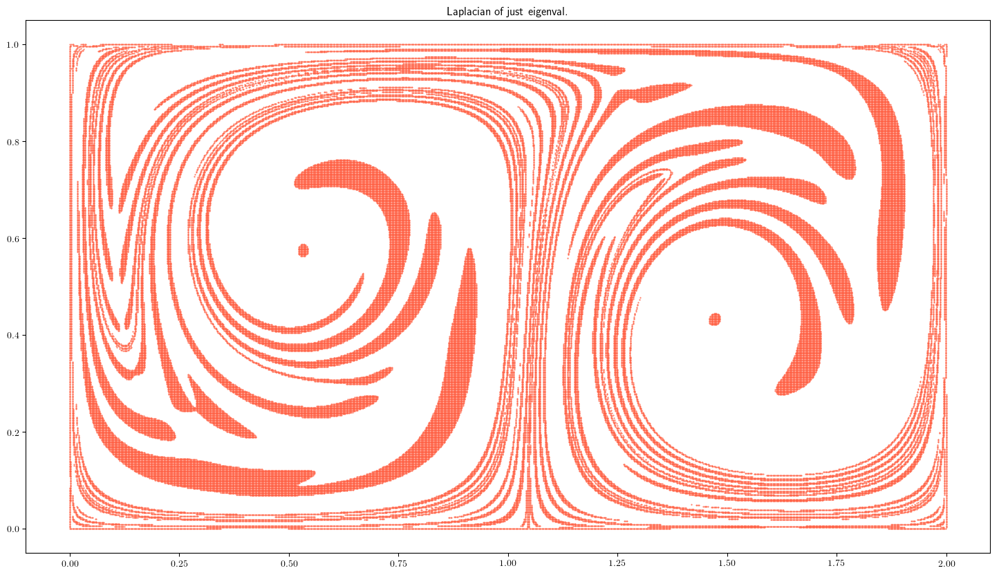

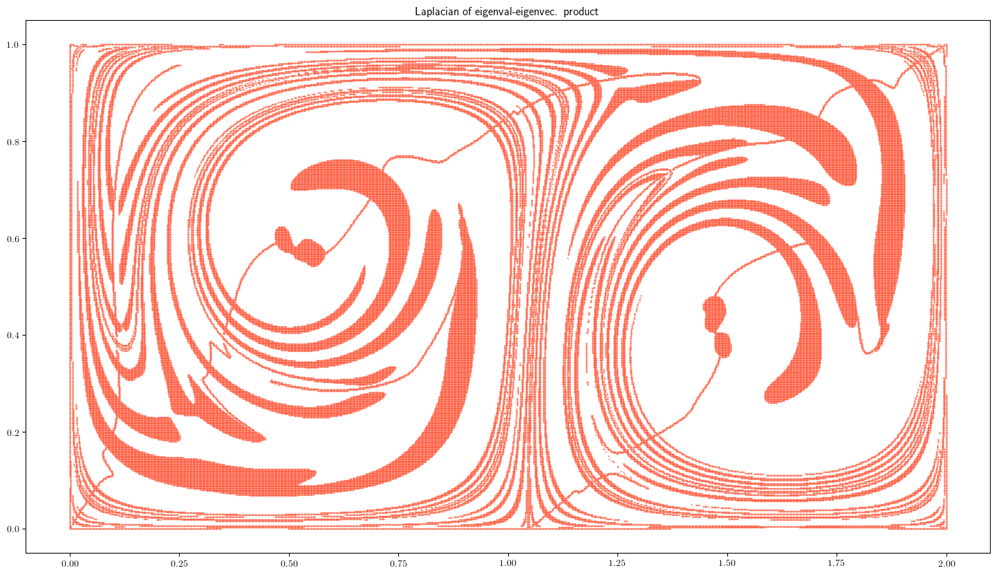

In [14]:
mask_ab = find_ab_mask(lmbd1,lmbd2,lapl_lmbd2,xi2,lapl_xi2)
mask_ab2 = find_ab_mask2(lmbd1,lmbd2,lapl_lmbd2,xi2,lapl_xi2)

plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,marker='.',c='tomato')
plt.title('Laplacian of just eigenval.')

plt.figure()
plt.scatter(grid[0,mask_ab2],grid[1,mask_ab2],s=1,marker='.',c='tomato')
plt.title('Laplacian of eigenval-eigenvec. product')

# Function which finds $\mathcal{G_{0}}$

In [15]:
def find_g0(nx,ny,num_horz,num_vert):
    mask = np.zeros((nx,ny),dtype=bool)
    stride_horz = np.floor(nx/(num_horz+1)).astype(int)
    stride_vert = np.floor(ny/(num_vert+1)).astype(int)
    
    for j in range(1,num_vert+1):
        mask[np.minimum(j*stride_horz,nx-1),:] = True
    for j in range(1,num_horz+1):
        mask[:,np.minimum(j*stride_vert,ny-1)] = True
    
    mask = mask.reshape(nx*ny)
    
    return mask

# Choose no. of vert. and horz. lines in $\mathcal{G}_{0}$

In [16]:
num_horz = 4
num_vert = 4

# Find and plot $\mathcal{G}_{0}$

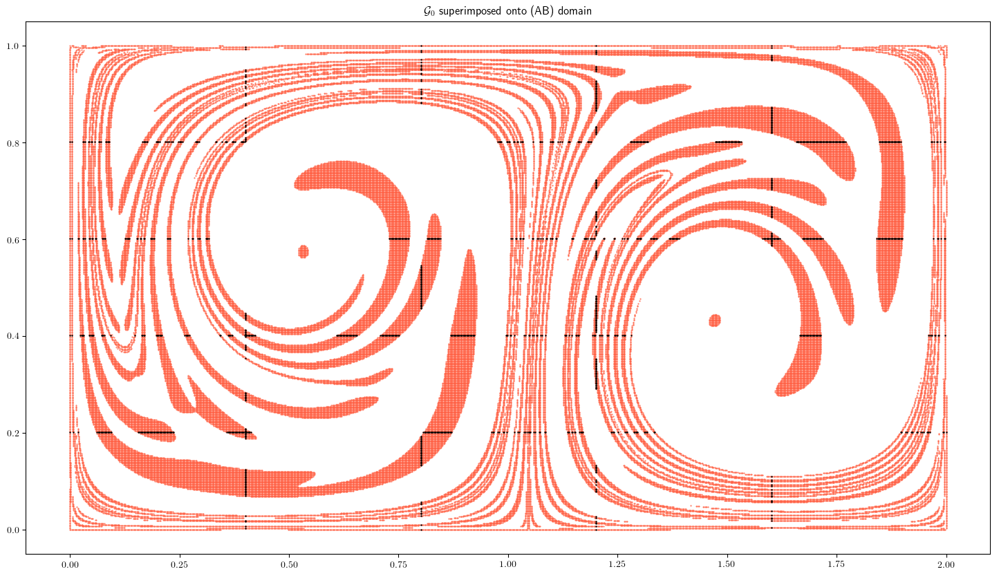

In [17]:
mask_g0 = find_g0(nx,ny,num_horz,num_vert)

g0 = grid[:,np.logical_and(mask_g0,mask_ab)]

plt.scatter(grid[0,mask_ab],grid[1,mask_ab],marker='.',s=1,c='tomato')
plt.scatter(g0[0],g0[1],marker='.',s=2,c='k')
plt.title(r'$\mathcal{G}_{0}$ superimposed onto (AB) domain')

# Functions returning derivatives and evaluating whether or not a point is within the numerical definition domain, as well as the (A,B)-domain

In [18]:
class LinearSpecialDerivative:
    def __init__(self,grid,xi):
        self.grid = grid
        self.dx = self.grid[0,1,0]-self.grid[0,0,0]
        self.dy = self.grid[1,0,1]-self.grid[1,0,0]
        self.xi = xi
        self.prev = None
        self.reverse = False
    def clear_previous(self):
        self.prev = None
    def set_previous(self,prev):
        self.prev = prev
    def flip(self):
        self.reverse = True
    def flip_back(self):
        self.reverse = False
    def __call__(self,pos):
        
        if pos[0] > x_max + self.dx:
            pos[0] = x_max + self.dx
        elif pos[0] < x_min - self.dx:
            pos[0] = x_min - self.dx
        
        if pos[1] > y_max + self.dy:
            pos[1] = y_max + self.dy
        elif pos[1] < y_min - self.dy:
            pos[1] = y_min - self.dy
        
        i = int(np.maximum(0,np.minimum(pos[0]/self.dx,np.size(self.grid,1)-2)))
        j = int(np.maximum(0,np.minimum(pos[1]/self.dy,np.size(self.grid,2)-2)))

        
        subxi = self.xi[:,i:i+2,j:j+2]

        # Choose pivot vector and fix directions of others based on this one
        for ii in range(2):
            for jj in range(2):
                if ii is 0 and jj is 0:
                    pass
                else:
                    dp = np.sign(np.dot(subxi[:,0,0],subxi[:,ii,jj]))
                    if dp < 0:
                        subxi[:,ii,jj] = - subxi[:,ii,jj]
                    #subxi[:,ii,jj] = np.sign(np.dot(subxi[:,0,0],subxi[:,ii,jj])) * subxi[:,ii,jj]
                    
        wr = (pos[0]-i*self.dx)/self.dx
        wl = 1-wr
        wt = (pos[1]-j*self.dy)/self.dy
        wb = 1-wt
        
        xi = wl*(wb*subxi[:,0,0]+wt*subxi[:,0,1])+wr*(wb*subxi[:,1,0]+wt*subxi[:,1,1])
        # Normalize xi
        xi = xi / np.sqrt(xi[0]**2+xi[1]**2)
        
        if self.prev is None:
            if not self.reverse:
                sign = 1.
            else:
                sign = -1.
        else:
            sign = -1. if np.sign(np.dot(self.prev,xi)) < 0 else 1.
        return sign*xi
    
class InABDomain:
    def __init__(self,pos_init,lmbd1,lmbd2,lapl_lmbd2,xi2,x_min,x_max,y_min,y_max,padding_factor=0.01):
        self._lmbd1_spline = RectBivariateSpline(pos_init[1,0,:],pos_init[0,:,0],lmbd1.T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)
        self._lmbd2_spline = RectBivariateSpline(pos_init[1,0,:],pos_init[0,:,0],lmbd2.T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)
        self._lapl_lmbd2_spline = RectBivariateSpline(pos_init[1,0,:],pos_init[0,:,0],lapl_lmbd2.T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)
        self._xi2_x_spline = RectBivariateSpline(pos_init[1,0,:],pos_init[0,:,0],xi2[0].T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)
        self._xi2_y_spline = RectBivariateSpline(pos_init[1,0,:],pos_init[0,:,0],xi2[1].T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)
        
    def __call__(self,pos):
        lmbd1 = self._lmbd1_spline.ev(pos[1],pos[0])
        lmbd2 = self._lmbd2_spline.ev(pos[1],pos[0])
        lapl_lmbd2 = self._lapl_lmbd2_spline.ev(pos[1],pos[0])
        xi2 = np.array([self._xi2_x_spline.ev(pos[1],pos[0]),self._xi2_y_spline.ev(pos[1],pos[0])])
        xi2 = xi2/np.sqrt(xi2[0]**2+xi2[1]**2)
        return ((lmbd1 is not lmbd2) and (lmbd2 > 1) and (np.dot(xi2,lapl_lmbd2*xi2) <= 0))
    
class InNumericalDomain:
    def __init__(self,x_min,x_max,y_min,y_max,nx,ny):
        dx = (x_max-x_min)/(nx-1)
        dy = (y_max-y_min)/(ny-1)
        self._x_min = x_min-dx
        self._x_max = x_max+dx
        self._y_min = y_min-dy
        self._y_max = y_max+dx
    
    def __call__(self,pos):
        return pos[0] >= self._x_min and pos[0] <= self._x_max and pos[1] >= self._y_min and pos[1] <= self._y_max
    
class Alpha:
    def __init__(self,lmbd1_spline,lmbd2_spline):
        self.lmbd1_spline = lmbd1_spline
        self.lmbd2_spline = lmbd2_spline
    def __call__(self,pos):
        lmbd1 = self.lmbd1_spline.ev(pos[1],pos[0])
        lmbd2 = self.lmbd2_spline.ev(pos[1],pos[0])
        return ((lmbd2-lmbd1)/(lmbd2+lmbd1))**2

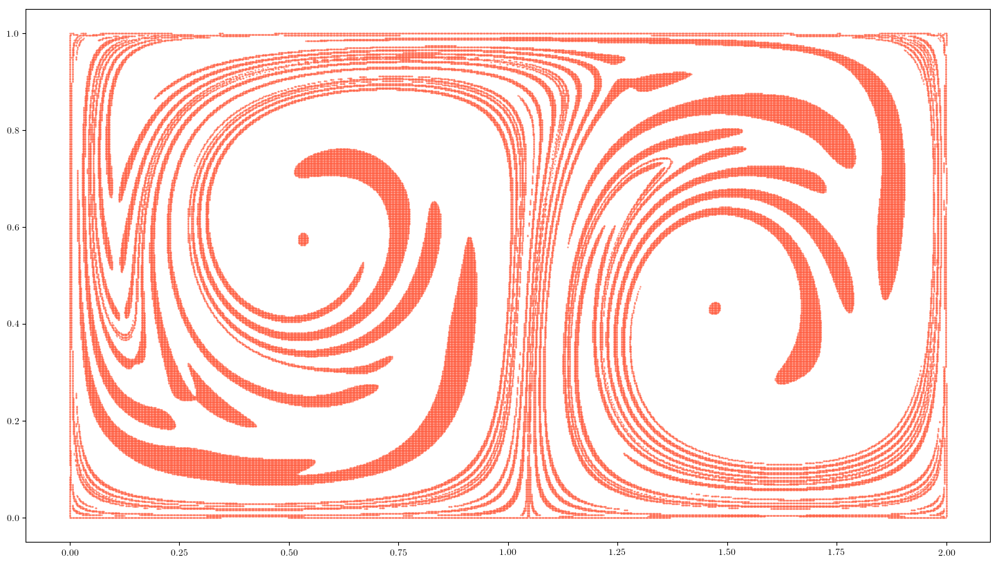

In [19]:
plt.figure()
mask_b = _b_true(lapl_lmbd2,xi2)
plt.scatter(grid[0,mask_b],grid[1,mask_b],s=1,marker='.',c='tomato')

# Class definition for the Strainline class

In [20]:
class Strainline:
    def __init__(self,startpoint,l_min,l_f_max,lmbd2_spline):
        self.pos = np.array([startpoint]).reshape((2,1))
        self.l_min = l_min
        self.len = 0.
        self.lmbd2_spline = lmbd2_spline
        self.stationary = np.zeros(2,dtype=np.bool)
        self.cont_failure = np.zeros(2,dtype=np.bool)
        self.outs_dom = np.zeros(2,dtype=np.bool)
        self.max_iter = np.zeros(2,dtype=np.bool)
        self.startpoint_index = 0
    def long_enough(self):
        return self.len >= self.l_min
    def append(self,pos):
        self.pos = np.hstack((self.pos,pos.reshape((2,1))))
    def avg_lmbd2(self):
        return np.mean(self.lmbd2_spline.ev(self.pos[1,:],self.pos[0,:]))
    def set_length(self,l):
        self.len = l
        
# Function that merges strainline backwards and forwards iterations
def merge_backwards_forwards(strainlines_backwards,strainlines_forwards):
    for strainline_backwards,strainline_forwards in zip(strainlines_backwards,strainlines_forwards):
        strainline_backwards.startpoint_index = strainline_backwards.pos.shape[1]-1
        strainline_backwards.pos = np.hstack((strainline_backwards.pos[:,::-1],strainline_forwards.pos[:,1:]))
        strainline_backwards.l += strainline_forwards.l
        #strainline_backwards.stationary = strainline_backwards.stationary or strainline_forwards.stationary
        #strainline_backwards.cont_failure = strainline_backwards.cont_failure or strainline_forwards.cont_failure
        #strainline_backwards.outs_dom = strainline_backwards.outs_dom or strainline_forwards.outs_dom
        #strainline_backwards.max_iter = strainline_backwards.max_iter or strainline_forwards.max_iter
    return strainlines_backwards

def RK4_iterator(pos_prev,stride,rhs):
    pos_new = np.zeros(2)
    lk = np.zeros((2,5))
    lk[:,1] = rhs(pos_prev)
    lk[:,2] = rhs(pos_prev+lk[:,1]*stride/2.)
    lk[:,3] = rhs(pos_prev+lk[:,2]*stride/2.)
    lk[:,4] = rhs(pos_prev+lk[:,3]*stride)
    lk[:,0] = (lk[:,1]+2*lk[:,2]+2*lk[:,3]+lk[:,4])/6.
    pos_new[0] = pos_prev[0]+lk[0,0]*stride
    pos_new[1] = pos_prev[1]+lk[1,0]*stride
    return pos_new
    

# Functions which advect strainlines

In [21]:
def iteratestrainline(startpoint,max_iter,rhs_f,rhs_b,stride,l_f_max,l_min,alpha,tol_alpha,in_ab,in_domain,lmbd2_spline):
    strainline_f = Strainline(startpoint,l_min,l_f_max,lmbd2_spline)
    counter = 0
    l_f = 0.
    L = 0.
    rhs_f.clear_previous()
    rhs_f.set_previous(rhs_f(strainline_f.pos[:,-1]))
    
    rhs_b.clear_previous()
    rhs_b.set_previous(-rhs_f.prev)
    
    
    pos_trial = RK4_iterator(strainline_f.pos[:,-1],stride,rhs_f)
    while l_f<l_f_max and alpha(pos_trial)>tol_alpha and in_domain(pos_trial) and counter<max_iter:
        L += np.sqrt((pos_trial[0]-strainline_f.pos[0,-1])**2+(pos_trial[1]-strainline_f.pos[1,-1])**2)
        if not in_ab(pos_trial):
            l_f += np.sqrt((pos_trial[0]-strainline_f.pos[0,-1])**2+(pos_trial[1]-strainline_f.pos[1,-1])**2)
        else:
            l_f = 0.
        strainline_f.append(pos_trial)
        rhs_f.set_previous(rhs_f(strainline_f.pos[:,-2]))
        counter+=1
        pos_trial = RK4_iterator(strainline_f.pos[:,-1],stride,rhs_f)
    if l_f>=l_f_max:
        strainline_f.cont_failure[1] = True
    if alpha(strainline_f.pos[:,-1])<=tol_alpha:
        strainline_f.stationary[1] = True
    if not in_domain(pos_trial):
        strainline_f.outs_dom[1] = True
    if counter == max_iter:
        strainline_f.max_iter[1] = True
        
    #print(strainline_f.pos[:,:10])
        
    strainline_f.set_length(L)
        
    strainline_b = Strainline(startpoint,l_min,l_f_max,lmbd2_spline)
    counter = 0
    l_f = 0.
    L = 0.
    #rhs.flip()

    #print(rhs_b.prev)
    pos_trial = RK4_iterator(strainline_b.pos[:,-1],stride,rhs_b)
    while l_f<l_f_max and alpha(pos_trial)>tol_alpha and in_domain(pos_trial) and counter<max_iter:
        L += np.sqrt((pos_trial[0]-strainline_b.pos[0,-1])**2+(pos_trial[1]-strainline_b.pos[1,-1])**2)
        if not in_ab(pos_trial):
            l_f += np.sqrt((pos_trial[0]-strainline_b.pos[0,-1])**2+(pos_trial[1]-strainline_b.pos[1,-1])**2)
        else:
            l_f = 0.
        strainline_b.append(pos_trial)
        rhs_b.set_previous(rhs_b(strainline_b.pos[:,-2]))
        counter+=1
        pos_trial = RK4_iterator(strainline_b.pos[:,-1],stride,rhs_b)
    if l_f>=l_f_max:
        strainline_b.cont_failure[0] = True
    if alpha(strainline_b.pos[:,-1])<=tol_alpha:
        strainline_b.stationary[0] = True
    if not in_domain(pos_trial):
        strainline_b.outs_dom[0] = True
    if counter == max_iter:
        strainline_b.max_iter[0] = True
        
    #print(strainline_b.pos[:,:10])
        
    strainline_b.set_length(L)
    
    strainline_b.startpoint_index = strainline_b.pos.shape[1]-1
    strainline_b.pos = np.hstack((strainline_b.pos[:,::-1],strainline_f.pos[:,1:]))
    strainline_b.len += strainline_f.len
    strainline_b.stationary[1] = strainline_f.stationary[1]
    strainline_b.cont_failure[1] = strainline_f.cont_failure[1]
    strainline_b.outs_dom[1] = strainline_f.outs_dom[1]
    strainline_b.max_iter[1] = strainline_f.max_iter[1]
    
    return strainline_b

def computestrainlines(dompts,max_iter,rhs_f,rhs_b,stride,l_f_max,l_min,alpha,tol_alpha,in_ab,in_domain,lmbd2_spline,pn,q):
    strainlines = []
    for j in range(np.size(dompts,1)):
        strainlines.append(iteratestrainline(dompts[:,j],max_iter,rhs_f,rhs_b,stride,l_f_max,l_min,alpha,tol_alpha,in_ab,in_domain,lmbd2_spline))
        if not (np.mod(j +  1 +  np.floor(np.size(dompts,1)/4).astype(int), np.floor(np.size(dompts,1)/4).astype(int))):
            print('Process {}: Finished integrating strainline candidate {} of {}'.format(pn,j+1,np.size(dompts,1)))
    q.put(strainlines)


# Function advecting strainlines

In [22]:
def develop_strainlines(max_iter,stride,l_f_max,l_min,tol_alpha,padding_factor=0.01,n_proc=4):
    strainlines = []
    
    line = []

    in_AB_domain = InABDomain(np.reshape(grid,(2,nx,ny)),np.reshape(lmbd1,(nx,ny)),np.reshape(lmbd2,(nx,ny)),np.reshape(lapl_lmbd2,(nx,ny)),np.reshape(xi2,(2,nx,ny)),x_min,x_max,y_min,y_max,padding_factor)
    in_numerical_domain = InNumericalDomain(x_min,x_max,y_min,y_max,nx,ny)

    lmbd1_spline = RectBivariateSpline(np.reshape(grid,(2,nx,ny))[1,0,:],np.reshape(grid,(2,nx,ny))[0,:,0],np.reshape(lmbd1,(nx,ny)).T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)
    lmbd2_spline = RectBivariateSpline(np.reshape(grid,(2,nx,ny))[1,0,:],np.reshape(grid,(2,nx,ny))[0,:,0],np.reshape(lmbd2,(nx,ny)).T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)

    rhs_f = LinearSpecialDerivative(np.reshape(grid,(2,nx,ny)),np.reshape(xi1,(2,nx,ny)))
    rhs_b = LinearSpecialDerivative(np.reshape(grid,(2,nx,ny)),np.reshape(xi1,(2,nx,ny)))
    alpha = Alpha(lmbd1_spline,lmbd2_spline)   
    
    #return iteratestrainline(g0[:,lineno],max_iter,rhs_f,rhs_b,integrator,stride,l_f_max,l_min,alpha,tol_alpha,in_AB_domain,in_numerical_domain,lmbd2_spline)

    partition = np.floor(np.size(g0,1)/n_proc).astype(int)
    
    qlist = [mp.Queue() for j in range(n_proc)]
    plist = [mp.Process(target=computestrainlines,
                       args = (g0[:,j*partition:np.size(g0,1) if j+1 is n_proc else (j+1)*partition],
                              max_iter,rhs_f,rhs_b,stride,l_f_max,l_min,alpha,tol_alpha,in_AB_domain,in_numerical_domain,lmbd2_spline,j,qlist[j])) 
             for j in range(n_proc)]
    tic = time.time()
    for p in plist:
        p.start()
    for q in qlist:
        strainlines = strainlines + q.get()
    for p in plist:
        p.join()
    mins, secs = np.divmod(time.time()-tic,60)
    print('Strainline iteration finished in {} minutes and {} seconds'.format(mins,secs))
    return strainlines


# Actually develop strainlines

In [23]:
max_iter = 20000
stride = 0.0005
l_f_max = 0.3
l_min = 1.
tol_alpha = 1.e-6

strainlines = develop_strainlines(max_iter,stride,l_f_max,l_min,tol_alpha)

Process 3: Finished integrating strainline candidate 85 of 342
Process 0: Finished integrating strainline candidate 85 of 341
Process 1: Finished integrating strainline candidate 85 of 341
Process 2: Finished integrating strainline candidate 85 of 341
Process 1: Finished integrating strainline candidate 170 of 341
Process 1: Finished integrating strainline candidate 255 of 341
Process 3: Finished integrating strainline candidate 170 of 342
Process 0: Finished integrating strainline candidate 170 of 341
Process 2: Finished integrating strainline candidate 170 of 341
Process 1: Finished integrating strainline candidate 340 of 341
Process 0: Finished integrating strainline candidate 255 of 341
Process 3: Finished integrating strainline candidate 255 of 342
Process 2: Finished integrating strainline candidate 255 of 341
Process 0: Finished integrating strainline candidate 340 of 341
Process 3: Finished integrating strainline candidate 340 of 342
Process 2: Finished integrating strainline c

In [24]:
np.save('precomputed_strainlines/rk4/nx={}_ny={}_t_start={}_t_end={}_max_iter={}_stride={}_l_f_max={}_l_min={}_tol_alpha={}.npy'.format(nx,ny,t_start,t_end,max_iter,stride,l_f_max,l_min,tol_alpha),strainlines)

In [25]:
indices = []
for j, strainline in enumerate(strainlines):
    if np.any(strainline.max_iter):
        indices.append(j)

In [33]:
indices

[218,
 302,
 303,
 315,
 354,
 355,
 356,
 357,
 358,
 359,
 360,
 361,
 394,
 396,
 398,
 400,
 515,
 627,
 632]

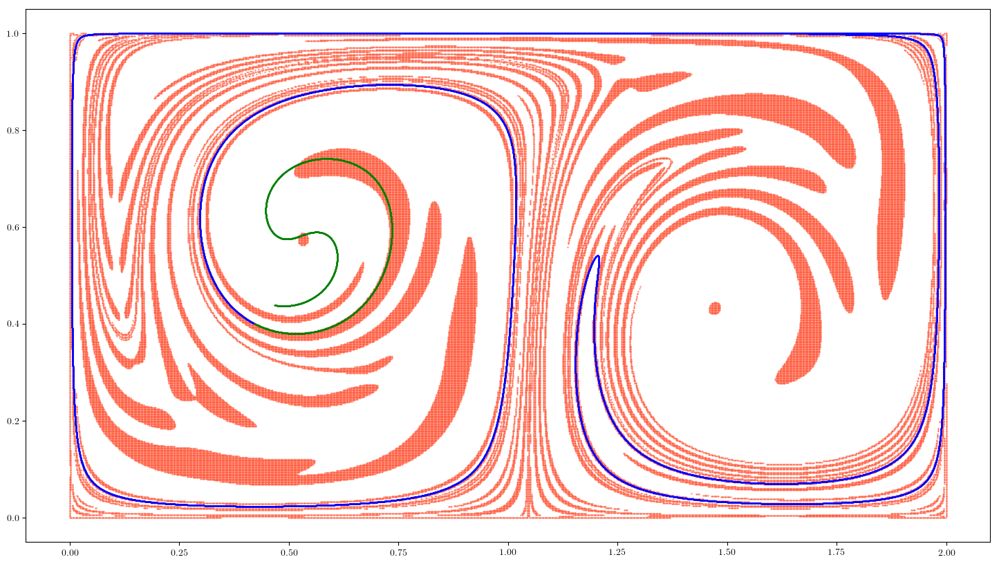

In [40]:
ind = 355
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='tomato',s=1,marker='.')
plt.scatter(strainlines[ind].pos[0,strainlines[ind].startpoint_index:],strainlines[ind].pos[1,strainlines[ind].startpoint_index:],c='b',marker='.',s=1)
plt.scatter(strainlines[ind].pos[0,:strainlines[ind].startpoint_index],strainlines[ind].pos[1,:strainlines[ind].startpoint_index],c='g',marker='.',s=1)

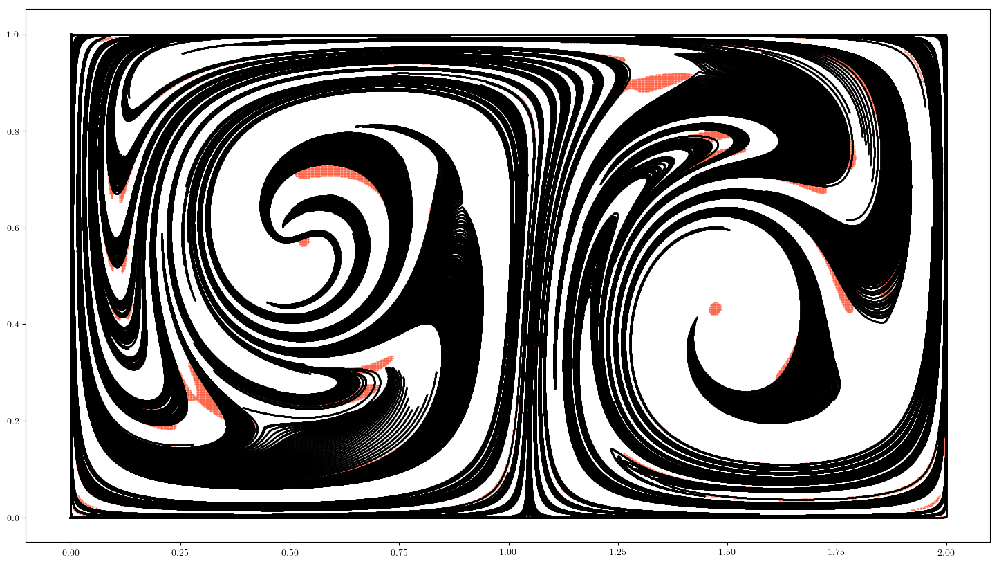

In [41]:
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,marker='.',c='tomato')
for strainline in strainlines:
    plt.scatter(strainline.pos[0],strainline.pos[1],s=1,marker='.',c='k')

# Function identifying intersections between strainlines and $\mathcal{L}$

In [43]:
def find_intersections(strainlines,pos_init,nx,ny,num_horz,num_vert):
    vert_x,horz_y = find_vert_and_horz_lines(pos_init,nx,ny,num_horz,num_vert)
    n_strainlines = len(strainlines)
    isect_horz = [[[[],[]] for i in range(num_horz)] for j in range(n_strainlines)]
    isect_vert = [[[[],[]] for i in range(num_vert)] for j in range(n_strainlines)]
    for i in range(n_strainlines):
        traj = strainlines[i].pos
        for j in range(num_horz):
            for k in range(np.size(traj,1)-1):
                if (traj[1,k]-horz_y[j])*(traj[1,k+1]-horz_y[j])<=0:
                    wk = (traj[1,k+1]-horz_y[j])/(traj[1,k+1]-traj[1,k])
                    isect_horz[i][j][0].append(wk*traj[0,k]+(1-wk)*traj[0,k+1])
                    isect_horz[i][j][1].append(horz_y[j])
        for j in range(num_vert):
            for k in range(np.size(traj,1)-1):
                if (traj[0,k]-vert_x[j])*(traj[0,k+1]-vert_x[j])<=0:
                    wk = (traj[0,k+1]-vert_x[j])/(traj[0,k+1]-traj[0,k])
                    isect_vert[i][j][0].append(vert_x[j])
                    isect_vert[i][j][1].append(wk*traj[1,k]+(1-wk)*traj[1,k+1])                
    return isect_horz,isect_vert

# Function which finds coordinates of the horizontal and vertical lines in $\mathcal{L}$

In [44]:
def find_vert_and_horz_lines(pos_init,nx,ny,num_horz,num_vert):
    pos_init = pos_init.reshape(2,nx,ny)
    stride_horz = np.floor(np.size(pos_init,1)/(num_horz+1)).astype(int)
    stride_vert = np.floor(np.size(pos_init,2)/(num_vert+1)).astype(int)
    
    vert_x = np.empty(num_vert)
    horz_y = np.empty(num_horz)
    
    for j in range(num_vert):
        vert_x[j] = pos_init[0,(j+1)*stride_horz,0]
        
    for j in range(num_horz):
        horz_y[j] = pos_init[1,0,(j+1)*stride_vert]
    
    return vert_x,horz_y

# Find aforementioned intersections

In [45]:
num_vert_comp = 6
num_horz_comp = 6

vert_x, horz_y = find_vert_and_horz_lines(grid,nx,ny,num_horz_comp,num_vert_comp)
isect_horz,isect_vert = find_intersections(strainlines,grid,nx,ny,num_horz_comp,num_vert_comp)

# Functions which find sufficiently close neighboring strainlines near intersections

In [47]:
def _find_neighbors(strainlines,num_horz,num_vert,intersections_horz,intersections_vert,l_n,n0,nend,pn,q):
    n_strainlines = len(strainlines)
    all_neighbors = []
    for i in range(n0,nend):
        neighbors = []
        for j in range(num_horz):
            line_neighbors = []
            #line_neighbors.append(i)
            for k in range(n_strainlines):
                # Need to iterate through all the intersections
                for m in range(np.minimum(np.size(intersections_horz[i][j][0]),np.size(intersections_horz[k][j][0]))):
                    if k is not i and np.abs(intersections_horz[i][j][0][m]-intersections_horz[k][j][0][m]) < l_n:
                        line_neighbors.append(k)
            neighbors.append(line_neighbors)
        for j in range(num_vert):
            line_neighbors = []
            #line_neighbors.append(i)
            for k in range(n_strainlines):
                # Need to iterate through all the intersections
                for m in range(np.minimum(np.size(intersections_vert[i][j][1]),np.size(intersections_vert[k][j][1]))):
                    if k is not i and np.abs(intersections_vert[i][j][1][m]-intersections_vert[k][j][1][m]) < l_n:
                        line_neighbors.append(k)
            neighbors.append(line_neighbors)
        all_neighbors.append(neighbors)
        if not np.mod(i+1-n0,np.floor((nend-n0)/4).astype(int)):
            print('Process {}: Found neighbors for {} of {} strainlines'.format(pn,i+1-n0,nend-n0))
    q.put(all_neighbors)
    
def find_neighbors(strainlines,num_horz,num_vert,intersections_horz,intersections_vert,l_n,n_proc=4):
    partition = np.floor(len(strainlines)/n_proc).astype(int)
    queues = [mp.Queue() for j in range(n_proc)]
    processes = [mp.Process(target=_find_neighbors,
                           args=(strainlines,num_horz,num_vert,intersections_horz,intersections_vert,
                                l_n,j*partition,len(strainlines) if j+1==n_proc else (j+1)*partition,j,queues[j]))
                for j in range(n_proc)]
    all_neighbors = []
    tic = time.time()
    for process in processes:
        process.start()
    for q in queues:
        all_neighbors += q.get()
    for process in processes:
        process.join()
    mins,secs = np.divmod(time.time()-tic,60)
    print('Neighbors found in {} minutes and {} seconds'.format(mins,secs))
    return all_neighbors

# Identifying aforementioned neighbors

In [ ]:
l_n = 0.1

nbrs = find_neighbors(strainlines,num_horz_comp,num_vert_comp,isect_horz,isect_vert,l_n)

Process 3: Found neighbors for 85 of 342 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 341 strainlines


# Function which identifies LCSs based on comparisons of neighboring strainlines

In [ ]:
def findLCSs(strainlines,all_neighbors,num_horz,num_vert):
    num_lines = num_horz + num_vert
    LCSs = []
    progressbar = FloatProgress(min=0,max=len(strainlines))
    display(progressbar)
    lmbd2_avg = [strainline.avg_lmbd2() for strainline in strainlines]
    for i, strainline in enumerate(strainlines):
        if not np.mod(i+1,10):
            progressbar.value+=10
        for j in range(num_lines):
            indices = np.asarray(all_neighbors[i][j])
            T = [lmbd2_avg[k] for k in indices]
#            print(i,j)
            if (np.size(T) > 1 and lmbd2_avg[i] >= max(T) and strainline.long_enough()):
                LCSs.append(strainline)
                print('Strainline {} is an LCS!'.format(i))
                break
    print(len(LCSs))
    return LCSs

# Identifying LCSs:

In [ ]:
LCSs = findLCSs(strainlines,nbrs,num_horz_comp,num_vert_comp)

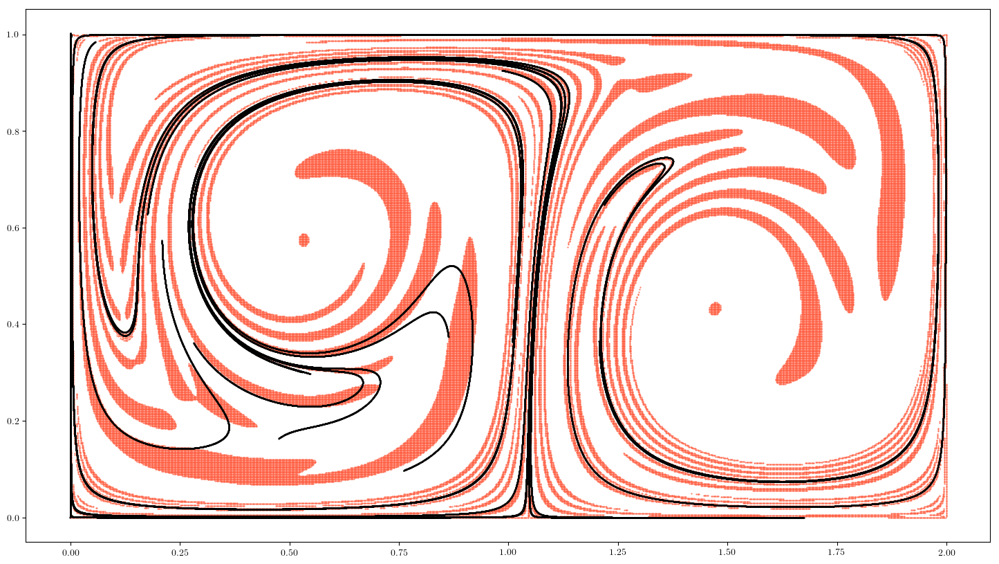

In [256]:
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,marker='.',c='tomato')
for j in range(len(LCSs)):
    plt.scatter(LCSs[j].pos[0],LCSs[j].pos[1],s=1,marker='.',c='k')

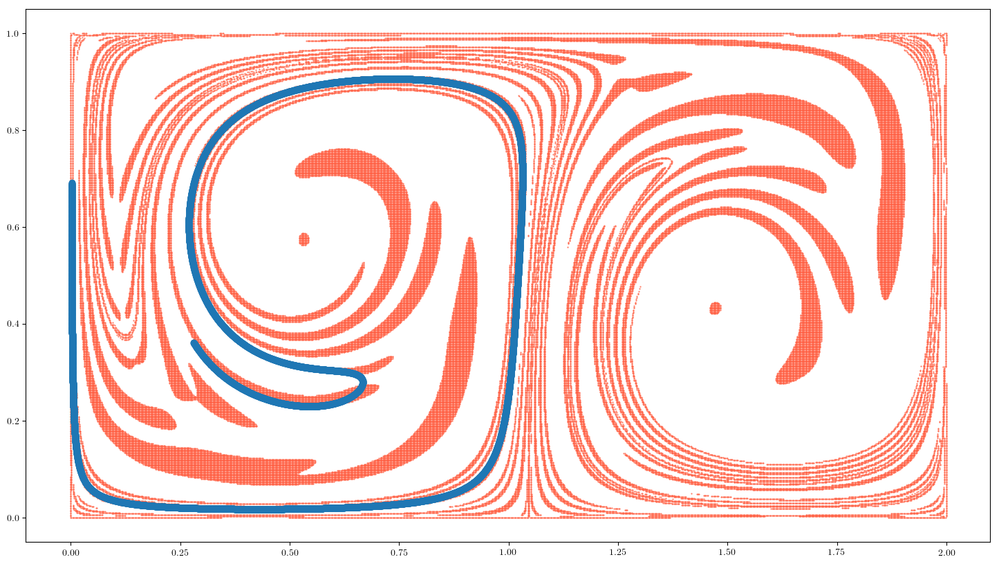

In [264]:
nmn3 = 289
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,marker='.',c='tomato')
plt.scatter(strainlines[nmn3].pos[0],strainlines[nmn3].pos[1])

#Strainline 0 is an LCS!
#Strainline 7 is an LCS!
#Strainline 14 is an LCS!
#Strainline 32 is an LCS!
#Strainline 85 is an LCS!
#Strainline 201 is an LCS!
#Strainline 236 is an LCS!
#Strainline 289 is an LCS!
#Strainline 608 is an LCS!
#Strainline 623 is an LCS!
#Strainline 642 is an LCS!
#Strainline 657 is an LCS!
#Strainline 659 is an LCS!
#Strainline 668 is an LCS!
#Strainline 697 is an LCS!
#Strainline 1362 is an LCS!

In [272]:
indices = []

for i in range(len(strainlines)):
    if np.any(strainlines[i].max_iter):
        indices.append(i)

In [1]:
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,marker='.',c='tomato')
for j in indices:
    plt.scatter(strainlines[j].pos[0],strainlines[j].pos[1],marker='.')

NameError: name 'plt' is not defined

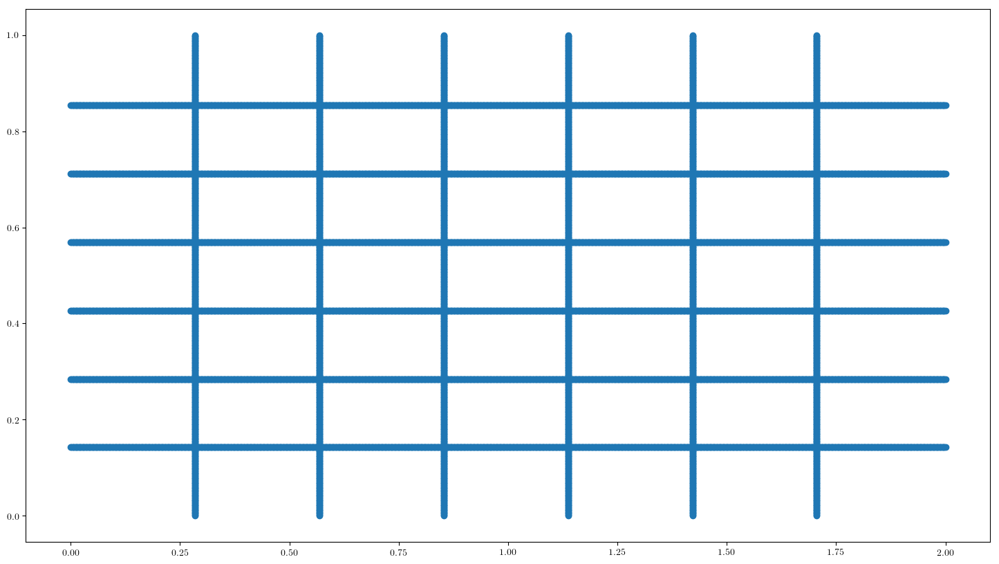

In [253]:
num_vert_comp = 6
num_horz_comp = 6

mask_comp = find_g0(nx,ny,num_vert_comp,num_horz_comp)

plt.scatter(grid[0,mask_comp],grid[1,mask_comp])

In [103]:
# Input: (numpy) array of coordinates, shape: (5,2,nx*ny), [grid,x,y]
def endpoints2(t_start,t_end,pos_start,stride,integrator,rhs,n_proc,atol,rtol):
    pos_end = np.empty(pos_start.shape)
    
    n_tot = pos_start.shape[2]
    part = np.floor(n_tot/n_proc).astype(int)
    
    qlist = [mp.Queue() for j in range(n_proc)]
    
    if integrator.__name__ in fixed_step_integrators:
        plist = [mp.Process(target=_endpoints_fixed2,
                           args=(t_start,t_end,pos_start[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part],
                                stride,integrator,rhs,j,qlist[j])) for j in range(n_proc)]
    else:
        plist = [mp.Process(target=_endpoints_adaptive2,
                           args=(t_start,t_end,pos_start[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part],
                                stride,integrator,rhs,j,qlist[j],atol,rtol)) for j in range(n_proc)]
    
    for p in plist:
        p.start()
    for j, q in enumerate(qlist):
        pos_end[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part] = q.get()
    for p in plist:
        p.join()
    
    return pos_end

def _endpoints_fixed2(t_start,t_end,pos_start,stride,integrator,rhs,pn,q):
    pos_fin = np.copy(pos_start)
    if t_end>t_start:
        for j in range(pos_fin.shape[0]):
            t = np.copy(t_start).astype(np.float64)
            h = np.copy(stride).astype(np.float64)
            #n_steps = np.ceil((t_end-t_start)/h).astype(int)
            #h = (t_end-t_start)/n_steps
            #for i in range(n_steps):
            while t<t_end:
                h = np.minimum(h,t_end-t)
                if j == 0 and pn == 0:
                    #print('t = {}, h = {}'.format(i*h,h))
                    print('t = {}, h = {}'.format(t,h))
                #foo,pos_fin[j],bar = integrator(i*h,pos_fin[j],h,rhs)
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs)
    else:
        print('hei')
        for j in range(np.size(pos_fin,0)):
            t = np.copy(t_start).astype(float)
            h = np.copy(stride).astype(float)
            while t>t_end:
                h=np.sign(h)*np.minimum(np.abs(h),np.abs(t-t_end))
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs)
    q.put(pos_fin)
    
def _endpoints_adaptive2(t_start,t_end,pos_start,stride,integrator,rhs,pn,q,atol,rtol):
    pos_fin = np.copy(pos_start)
    if t_end>t_start:
        for j in range(np.size(pos_fin,0)):
            t = np.ones(np.size(pos_fin[j]))*t_start
            h = np.ones(np.size(pos_fin[j]))*stride
            while np.any(t<t_end):
                h = np.minimum(h,t_end-t)
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs,atol,rtol)
    else:
        for j in range(np.size(pos_fin,0)):
            t = np.ones(np.size(pos_fin[j]))*t_start
            h = np.ones(np.size(pos_fin[j]))*stride
            while np.any(t>t_end):
                h = np.sign(h)*np.minimum(np.abs(h),np.abs(t-t_end))
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs,atol,rtol)
    q.put(pos_fin)

In [134]:
d = 1.e-5
from numerical_integrators.singlestep import rk2
integrator2 = rk4

t_end2 = 5

pos_in = np.array([padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max),
                  padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max) + np.array([d,0]).reshape(2,1),
                  padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max) + np.array([0,d]).reshape(2,1),
                  padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max) + np.array([-d,0]).reshape(2,1),
                  padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max) + np.array([0,-d]).reshape(2,1)])
tic = time.time()
pos_fin = endpoints(t_start,t_end,pos_in,h,integrator2,doublegyre_wrapper,n_proc=4,atol=None,rtol=None)
mins,secs = np.divmod(time.time()-tic,60)
print('{} minutes and {} seconds'.format(mins,secs))

8.0 minutes and 18.060338020324707 seconds


In [135]:
pos_fin[0,:,250][0]

-0.59977062068307752

In [77]:
eta = eta.reshape(2,nx*ny)

In [80]:
eta[:,250][0]

0.0

In [66]:
pos_in2 = np.empty(pos_in.shape)
for j in range(5):
    pos_in2[j,0,:] = pos_in[j,1,:]
    pos_in2[j,1,:] = pos_in[j,0,:]

In [68]:
pos_in2.shape
np.save('pos_in.npy',pos_in2)

In [18]:
# Preparation: Make 1st order spline interpolation objects of eigenvalues as well as xi1:

# First: Define padding factor for the numerical domain:
pad_fac = 0.01

grid_2D = grid.reshape(2,nx,ny)
xi1_2D = xi1.reshape(2,nx,ny)
lmbd1_spline = RectBivariateSpline(grid_2D[1,0,:],grid_2D[0,:,0],lmbd1.reshape(nx,ny).T,
                                   bbox=[y_min-(y_max-y_min)*pad_fac,y_max+(y_max-y_min)*pad_fac,
                                         x_min-(x_max-x_min)*pad_fac,x_max+(x_max-x_min)*pad_fac],
                                   kx=1,ky=1)
lmbd2_spline = RectBivariateSpline(grid_2D[1,0,:],grid_2D[0,:,0],lmbd2.reshape(nx,ny).T,
                                   bbox=[y_min-(y_max-y_min)*pad_fac,y_max+(y_max-y_min)*pad_fac,
                                         x_min-(x_max-x_min)*pad_fac,x_max+(x_max-x_min)*pad_fac],
                                   kx=1,ky=1)
lapl_lmbd2_spline = RectBivariateSpline(grid_2D[1,0,:],grid_2D[0,:,0],lapl_lmbd2.reshape(nx,ny).T,
                                   bbox=[y_min-(y_max-y_min)*pad_fac,y_max+(y_max-y_min)*pad_fac,
                                         x_min-(x_max-x_min)*pad_fac,x_max+(x_max-x_min)*pad_fac],
                                   kx=1,ky=1)
xi1x_spline = RectBivariateSpline(grid_2D[1,0,:],grid_2D[0,:,0],xi1[0].reshape(nx,ny).T,
                                   bbox=[y_min-(y_max-y_min)*pad_fac,y_max+(y_max-y_min)*pad_fac,
                                         x_min-(x_max-x_min)*pad_fac,x_max+(x_max-x_min)*pad_fac],
                                   kx=1,ky=1)
xi1y_spline = RectBivariateSpline(grid_2D[1,0,:],grid_2D[0,:,0],xi1[1].reshape(nx,ny).T,
                                   bbox=[y_min-(y_max-y_min)*pad_fac,y_max+(y_max-y_min)*pad_fac,
                                         x_min-(x_max-x_min)*pad_fac,x_max+(x_max-x_min)*pad_fac],
                                   kx=1,ky=1)
xi2x_spline = RectBivariateSpline(grid_2D[1,0,:],grid_2D[0,:,0],xi2[0].reshape(nx,ny).T,
                                   bbox=[y_min-(y_max-y_min)*pad_fac,y_max+(y_max-y_min)*pad_fac,
                                         x_min-(x_max-x_min)*pad_fac,x_max+(x_max-x_min)*pad_fac],
                                   kx=1,ky=1)
xi2y_spline = RectBivariateSpline(grid_2D[1,0,:],grid_2D[0,:,0],xi2[1].reshape(nx,ny).T,
                                   bbox=[y_min-(y_max-y_min)*pad_fac,y_max+(y_max-y_min)*pad_fac,
                                         x_min-(x_max-x_min)*pad_fac,x_max+(x_max-x_min)*pad_fac],
                                   kx=1,ky=1)



In [19]:
# Function which calculates the alpha value for a given point
def comp_alpha(x,y):
    lmbd1 = lmbd1_spline.ev(y,x)
    lmbd2 = lmbd2_spline.ev(y,x)
    return ((lmbd2-lmbd1)/(lmbd2+lmbd1))**2

# Function which checks whether a point is within the AB domain
def in_AB(x,y):
    lmbd1 = lmbd1_spline.ev(y,x)
    lmbd2 = lmbd2_spline.ev(y,x)
    lapl_lmbd2 = lapl_lmbd2_spline.ev(y,x)
    xi2 = np.array([xi2x_spline.ev(y,x),xi2y_spline.ev(y,x)])
    return np.logical_and(_a_true(lmbd1,lmbd2),_b_true(lapl_lmbd2,xi2))

# Function which checks whether a point is within the numerical domain
def in_dom(x,y):
    return (x <= x_max+(x_max-x_min)*pad_fac and x >= x_min-(x_max-x_min)*pad_fac
            and y <= y_max+(y_max-y_min)*pad_fac and y >= y_min-(y_max-y_min)*pad_fac)

def linear_special_xi1(x,y,last):
    dx = grid_2D[0,1,0]-grid_2D[0,0,0]
    dy = grid_2D[1,0,1]-grid_2D[1,0,0]
    
    i = int(np.maximum(0,np.minimum(x/dx,grid_2D.shape[1]-2)))
    j = int(np.maximum(0,np.minimum(y/dy,grid_2D.shape[2]-2)))
    
    subxi = xi1_2D[:,i:i+2,j:j+2]
    
    wr = (x-i*dx)/dx
    wl = 1-wr
    wt = (y-j*dy)/dy
    wb = 1-wt
    
    for i in range(2):
        for j in range(2):
            if not (i is 0 and j is 0):
                subxi[:,i,j] = -subxi[:,i,j] if np.sign(np.dot(subxi[:,i,j],subxi[:,0,0])) < 0 else subxi[:,i,j]
    
    xi = wl*(wb*subxi[:,0,0]+wt*subxi[:,0,1])+wr*(wb*subxi[:,1,0]+wt*subxi[:,1,1])
    # Normalize xi
    xi = xi / np.sqrt(xi[0]**2+xi[1]**2)
    #xi = xi.reshape((2,1))
    # Flip xi if the angle between it and the previous vector is > 90 deg
    return -xi if np.sign(np.dot(xi,last)) < 0 else xi

# Functions which iterate strainlines in either direction

In [20]:
def RK4_iterator(x,y,r_lst,stride):
    newcoords = np.empty((2,1))
    lk = np.empty((2,5))
    lk[:,1] = linear_special_xi1(x,y,r_lst)
    lk[:,2] = linear_special_xi1(x+lk[0,1]*stride/2,y+lk[1,1]*stride/2,r_lst)
    lk[:,3] = linear_special_xi1(x+lk[0,2]*stride/2,y+lk[1,2]*stride/2,r_lst)
    lk[:,4] = linear_special_xi1(x+lk[0,3]*stride,y+lk[1,3]*stride,r_lst)
    lk[:,0] = (lk[:,1]+2*lk[:,2]+2*lk[:,3]+lk[:,4])/6
    newcoords[0,0] = x+lk[0,0]*stride
    newcoords[1,0] = y+lk[1,0]*stride
    return newcoords

In [135]:
def iterate_strainline_forwards(startpoint,max_iter,stride,l_f_max,tol_alpha):
    counter = 0
    l_f = 0.
    l = 0.
    stopcriteria = np.zeros((4,1),dtype=np.bool) # Edge, stationary, outs. AB, max_iter
    coords = np.empty((2,1))
    coords[0,0] = startpoint[0]
    coords[1,0] = startpoint[1]
    xi1 = linear_special_xi1(coords[0,0],coords[1,0],np.zeros((2,1)))
    r_lst = xi1
    newcoords = RK4_iterator(coords[0,0],coords[1,0],r_lst,stride)
    while l_f<=l_f_max and comp_alpha(newcoords[0,0],newcoords[1,0])>tol_alpha and in_dom(newcoords[0,0],newcoords[1,0]) and counter < max_iter:
        l += np.sqrt((coords[0,-1]-newcoords[0,0])**2+(coords[1,-1]-newcoords[1,0])**2)
        if not in_AB(newcoords[0,0],newcoords[1,0]):
            l_f += np.sqrt((coords[0,-1]-newcoords[0,0])**2+(coords[1,-1]-newcoords[1,0])**2)
        else:
            l_f = 0.
        coords = np.hstack((coords,newcoords))
        r_lst = linear_special_xi1(coords[0,-2],coords[1,-2],r_lst)
        counter += 1
        newcoords= RK4_iterator(coords[0,-1],coords[1,-1],r_lst,stride)
    lmbd2_avg = np.mean(lmbd2_spline.ev(coords[1,1:],coords[0,1:]))
    if not in_dom(newcoords[0,0],newcoords[1,0]):
        stopcriteria[0,0] = True
    if comp_alpha(newcoords[0,0],newcoords[1,0])<=tol_alpha:
        stopcriteria[1,0] = True
    if l_f > l_f_max:
        stopcriteria[2,0] = True
    if counter >= max_iter:
        stopcriteria[3,0] = True
    return coords, lmbd2_avg, l, stopcriteria

def iterate_strainline_backwards(startpoint,max_iter,stride,l_f_max,tol_alpha):
    counter = 0
    l_f = 0.
    l = 0.
    stopcriteria = np.zeros((4,1),dtype=np.bool) # Edge, stationary, outs. AB, max_iter
    coords = np.empty((2,1))
    coords[0,0] = startpoint[0]
    coords[1,0] = startpoint[1]
    xi1 = linear_special_xi1(coords[0,0],coords[1,0],np.zeros((2,1)))
    r_lst = -xi1
    newcoords = RK4_iterator(coords[0,0],coords[1,0],r_lst,stride)
    while l_f<=l_f_max and comp_alpha(newcoords[0,0],newcoords[1,0])>tol_alpha and in_dom(newcoords[0,0],newcoords[1,0]) and counter < max_iter:
        l += np.sqrt((coords[0,-1]-newcoords[0,0])**2+(coords[1,-1]-newcoords[1,0])**2)
        if not in_AB(newcoords[0,0],newcoords[1,0]):
            l_f += np.sqrt((coords[0,-1]-newcoords[0,0])**2+(coords[1,-1]-newcoords[1,0])**2)
        else:
            l_f = 0.
        coords = np.hstack((coords,newcoords))
        r_lst = linear_special_xi1(coords[0,-2],coords[1,-2],r_lst)
        counter += 1
        newcoords= RK4_iterator(coords[0,-1],coords[1,-1],r_lst,stride)
    lmbd2_avg = np.mean(lmbd2_spline.ev(coords[1,:],coords[0,:]))
    if not in_dom(newcoords[0,0],newcoords[1,0]):
        stopcriteria[0,0] = True
    if comp_alpha(newcoords[0,0],newcoords[1,0])<=tol_alpha:
        stopcriteria[1,0] = True
    if l_f > l_f_max:
        stopcriteria[2,0] = True
    if counter >= max_iter:
        stopcriteria[3,0] = True
    return coords, lmbd2_avg, l, stopcriteria
   # while l_f<=l_f_max and comp_alpha(newcoords[0,0],newcoords[1,0])>tol_alpha and in_dom(newcoords[0,0],newcoords[1,0]) and counter < max_iter:
   #     l += np.sqrt((coords[0,-1]-newcoords[0,0])**2+(coords[1,-1]-newcoords[1,0])**2)
   #     if not in_AB(newcoords[0,0],newcoords[1,0]):
   #         l_f += np.sqrt((coords[0,-1]-newcoords[0,0])**2+(coords[1,-1]-newcoords[1,0])**2)
   #     else:
   #         l_f = 0
   #     coords = np.hstack((coords,newcoords))
   #     r_lst = linear_special_xi1(coords[0,-2],coords[1,-2],r_lst)
   #     counter += 1
   #     newcoords= RK4_iterator(coords[0,-1],coords[1,-1],r_lst,stride)
   # lmbd2_avg = np.mean(lmbd2_spline.ev(coords[1,:],coords[0,:]))
   # if not in_dom(newcoords[0,0],newcoords[1,0]):
   #     stopcriteria[0,0] = True
   # if comp_alpha(newcoords[0,0],newcoords[1,0])<=tol_alpha:
   #     stopcriteria[1,0] = True
   # if l_f > l_f_max:
   #     stopcriteria[2,0] = True
   # if counter >= max_iter:
   #     stopcriteria[3,0] = True
   # return coords, lmbd2_avg, l, stopcriteria
        

In [141]:
def compute_strainlines(dom_pts,max_iter,stride,l_f_max,tol_alpha,pn,q):
    strainlines = []
    lmbd2_avgs = []
    linelengths = []
    startpoint_indices = []
    stopcriteria = np.empty((8,1),dtype = np.bool)
    for j in range(dom_pts.shape[1]):
        strainline_f, lmbd2_avg_f, len_f, stop_f = iterate_strainline_forwards(np.copy(dom_pts[:,j]),max_iter,stride,l_f_max,tol_alpha)
        strainline_b, lmbd2_avg_b, len_b, stop_b = iterate_strainline_backwards(np.copy(dom_pts[:,j]),max_iter,stride,l_f_max,tol_alpha)
        strainline = np.append(strainline_b[:,::-1],strainline_f[:,1:],1)
        lmbd2_avg = (lmbd2_avg_f*(len(strainline_f)-1) + lmbd2_avg_b*len(strainline_b))/(len(strainline))
        linelength = len_f+len_b
        stopcriterion = np.append(stop_b,stop_f,0)
        strainlines.append(strainline)
        lmbd2_avgs.append(lmbd2_avg)
        linelengths.append(linelength)
        startpoint_indices.append(len(strainline_b))
        stopcriteria = np.append(stopcriteria,stopcriterion,1)
        if not (np.mod(j +  1 +  np.floor(dom_pts.shape[1]/4).astype(int), np.floor(dom_pts.shape[1]/4).astype(int))):
            print('Process {}: Finished integrating strainline candidate {} of {}'.format(pn,j+1,dom_pts.shape[1]))
    stopcriteria = stopcriteria[:,1:]
    q.put(strainlines)
    q.put(lmbd2_avgs)
    q.put(linelengths)
    q.put(startpoint_indices)
    q.put(stopcriteria)

In [142]:
n_proc = 4
max_iter = 10000
stride = 0.0005
l_f_max = 0.2
l_min = 1.
tol_alpha = 1e-6

partition = np.floor(g0.shape[1]/n_proc).astype(int)

strainlines = []
lmbd2_avgs = []
linelengths = []
startpoint_indices = []
stopcriteria = np.empty((8,1),dtype=np.bool)

tic = time.time()

queues = [mp.Queue() for j in range(n_proc)]
processes = [mp.Process(target = compute_strainlines,
                       args = (g0[:,j*partition:g0.shape[1] if j+1 is n_proc else (j+1)*partition],
                              max_iter,stride,l_f_max,tol_alpha,j,queues[j]))
            for j in range(n_proc)]

for p in processes:
    p.start()
for q in queues:
    strainlines_section, lmbd2_avgs_section, linelengths_section, startpoint_indices_section, stopcriteria_section = q.get(),q.get(),q.get(),q.get(),q.get()
    strainlines += strainlines_section
    lmbd2_avgs += lmbd2_avgs_section
    linelengths += linelengths_section
    startpoint_indices += startpoint_indices_section
    stopcriteria = np.hstack((stopcriteria,stopcriteria_section))
for p in processes:
    p.join()
stopcriteria = stopcriteria[:,1:]

mins,secs = np.divmod(time.time()-tic,60)

print('Strainline iteration finished in {} minutes and {} seconds'.format(mins,secs))

Process 1: Finished integrating strainline candidate 18 of 74
Process 0: Finished integrating strainline candidate 18 of 74
Process 3: Finished integrating strainline candidate 19 of 77
Process 2: Finished integrating strainline candidate 18 of 74
Process 3: Finished integrating strainline candidate 38 of 77
Process 1: Finished integrating strainline candidate 36 of 74
Process 0: Finished integrating strainline candidate 36 of 74
Process 3: Finished integrating strainline candidate 57 of 77
Process 1: Finished integrating strainline candidate 54 of 74
Process 2: Finished integrating strainline candidate 36 of 74
Process 1: Finished integrating strainline candidate 72 of 74
Process 3: Finished integrating strainline candidate 76 of 77
Process 0: Finished integrating strainline candidate 54 of 74
Process 2: Finished integrating strainline candidate 54 of 74
Process 0: Finished integrating strainline candidate 72 of 74
Process 2: Finished integrating strainline candidate 72 of 74
Strainli

In [114]:
def find_intersections(strainlines,vert_x,horz_y,max_isect_guess=5):
    n_strainlines = len(strainlines)
    isect_horz = np.ones((len(horz_y),n_strainlines,max_isect_guess),dtype=float)*(-1)
    isect_vert = np.ones((len(vert_x),n_strainlines,max_isect_guess),dtype=float)*(-1)
    counter_horz = np.zeros((len(horz_y),n_strainlines),dtype=int)
    counter_vert = np.zeros((len(vert_x),n_strainlines),dtype=int)
    for i in range(n_strainlines):
        for j in range(len(horz_y)):
            for k in range(np.size(strainlines[i][0,:])-1):
                if ((strainlines[i][1,k] < horz_y[j]) and (strainlines[i][1,k+1] > horz_y[j])) or ((strainlines[i][1,k] > horz_y[j]) and strainlines[i][1,k+1] < horz_y[j]):
                    wk = (strainlines[i][1,k+1]-horz_y[j])/(strainlines[i][1,k+1]-strainlines[i][1,k])
                    isect_horz[j,i,counter_horz[j,i]] = wk*strainlines[i][0,k] + (1-wk)*strainlines[i][0,k+1]
                    counter_horz[j,i] += 1
                    if counter_horz[j,i] > max_isect_guess - 1:
                        isect_horz = np.append(isect_horz,np.zeros((len(horz_y),n_strainlines,1)),2)
        for j in range(len(vert_x)):
            for k in range(np.size(strainlines[i][0,:])-1):
                if ((strainlines[i][0,k] < vert_x[j]) and (strainlines[i][0,k+1] > vert_x[j])) or ((strainlines[i][0,k] > vert_x[j]) and strainlines[i][0,k+1] < vert_x[j]):
                    wk = (strainlines[i][0,k+1]-vert_x[j])/(strainlines[i][0,k+1]-strainlines[i][0,k])
                    isect_vert[j,i,counter_vert[j,i]] = wk*strainlines[i][1,k] + (1-wk)*strainlines[i][1,k+1]
                    counter_vert[j,i] += 1
                    if counter_vert[j,i] > max_isect_guess - 1:
                        isect_vert = np.append(isect_vert,np.zeros((len(vert_x),n_strainlines,1)),2)
                        
    return isect_horz, isect_vert

In [115]:
vert_x, horz_y = find_vert_and_horz_lines(grid,nx,ny,num_horz,num_vert)
isect_horz,isect_vert = find_intersections(strainlines,vert_x,horz_y)

In [120]:
def reshape_intersections(isects,max_isects):
    isects_nu = np.zeros((isects.shape[0],isects.shape[1],max_isects))
    isects_nu[:,:,:isects.shape[2]] = isects
    return isects_nu
    
def find_neighbors(strainlines,isect_horz,isect_vert,n0,nend,pn,q):
    n_strainlines = len(strainlines)
    all_neighbors = []
    max_isects = np.maximum(isect_horz.shape[2],isect_vert.shape[2])
    if isect_horz.shape[2] < max_isects:
        isect_horz = reshape_intersections(isect_horz,max_isects)
    if isect_vert.shape[2] < max_isects:
        isect_vert = reshape_intersections(isect_vert,max_isects)
    isects = np.append(isect_horz,isect_vert,0)
    for i in range(n0,nend):
        neighbors = []
        for j in range(isects.shape[0]):
            line_neighbors = []
            for k in range(n_strainlines):
                for m in range(max_isects):
                    if (k is not i and np.minimum(isects[j,i,m],isects[j,k,m]) > -1 and np.abs(isects[j,i,m]-isects[j,k,m]) < l_n):
                        line_neighbors.append(k)
            neighbors.append(line_neighbors)
        all_neighbors.append(neighbors)
        if not (np.mod(i+1-n0,np.floor((nend-n0)/4).astype(int))):
            print('Process {}: Found neighbors for strainline candidate {} of {}'.format(pn,i+1-n0,nend-n0))
    q.put(all_neighbors)     

In [117]:
partition = np.floor(len(strainlines)/n_proc).astype(int)
l_n = 0.2
all_neighbors = []

queues = [mp.Queue() for j in range(n_proc)]
processes = [mp.Process(target = find_neighbors,
                       args = (strainlines,isect_horz,isect_vert,
                               j*partition,len(strainlines) if j+1 is n_proc else (j+1)*partition,
                               j, queues[j])) for j in range(n_proc)]

for p in processes:
    p.start()
for q in queues:
    all_neighbors = all_neighbors + q.get()
for p in processes:
    p.join()


Process 3: Found neighbors for strainline candidate 1 of 77
Process 0: Found neighbors for strainline candidate 1 of 74
Process 1: Found neighbors for strainline candidate 1 of 74
Process 2: Found neighbors for strainline candidate 1 of 74
Process 0: Found neighbors for strainline candidate 19 of 74
Process 2: Found neighbors for strainline candidate 19 of 74
Process 1: Found neighbors for strainline candidate 19 of 74
Process 3: Found neighbors for strainline candidate 20 of 77
Process 0: Found neighbors for strainline candidate 37 of 74
Process 2: Found neighbors for strainline candidate 37 of 74
Process 1: Found neighbors for strainline candidate 37 of 74
Process 3: Found neighbors for strainline candidate 39 of 77
Process 0: Found neighbors for strainline candidate 55 of 74
Process 2: Found neighbors for strainline candidate 55 of 74
Process 1: Found neighbors for strainline candidate 55 of 74
Process 3: Found neighbors for strainline candidate 58 of 77
Process 0: Found neighbors f

In [118]:
def find_LCSs(strainlines,neighbors,lmbd2_avgs,linelengths,l_min,num_horz,num_vert):
    LCSs = []
    for i,(strainline,lmbd2_avg,linelength) in enumerate(zip(strainlines,lmbd2_avgs,linelengths)):
        for j in range(num_horz+num_vert):
            indices = np.asarray(neighbors[i][j])
            T = [lmbd2_avgs[k] for k in indices]
            if lmbd2_avg >= max(T) and len(T) > 1 and linelength > l_min:
                LCSs.append(strainline)
                print('Strainline {} is an LCS!'.format(i))
                break
    return LCSs

In [119]:
LCSs = find_LCSs(strainlines,all_neighbors,lmbd2_avgs,linelengths,l_min,num_horz,num_vert)

Strainline 298 is an LCS!


(4, 299, 7)

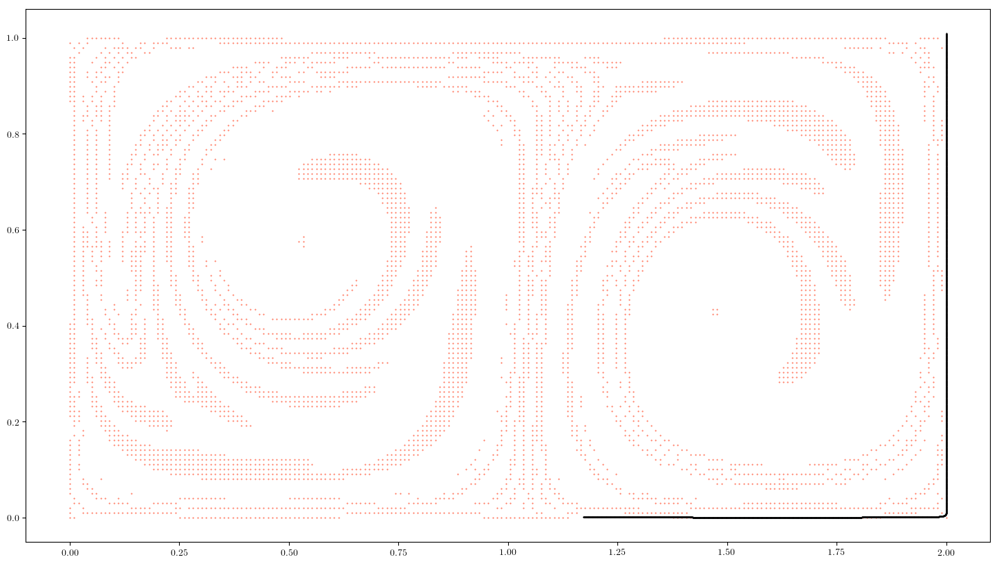

In [121]:
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,marker='.',c='tomato')
plt.scatter(LCSs[0][0],LCSs[0][1],s=1,marker='.',c='k')

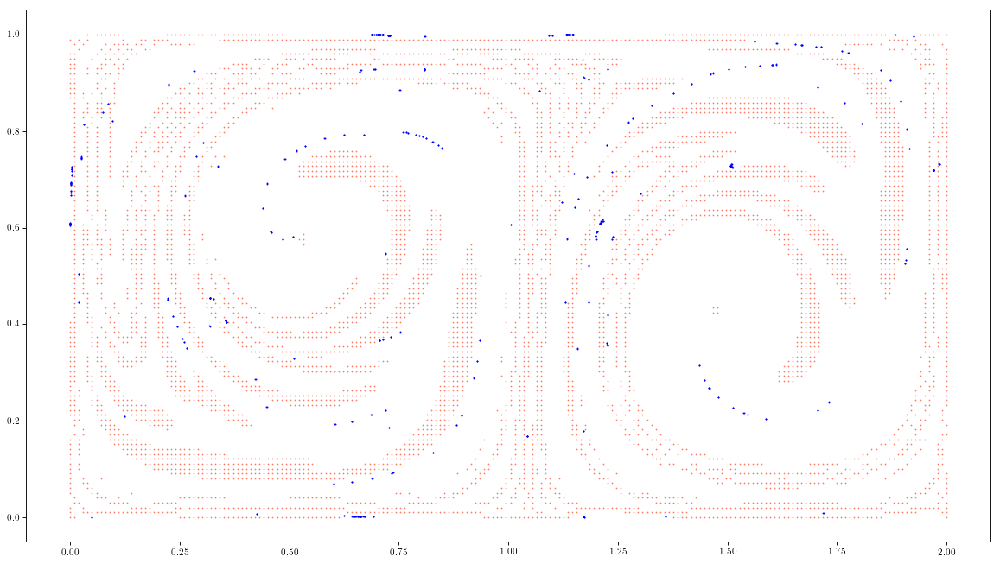

In [146]:
plt.figure(figsize=(18, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='tomato',s=1,marker='.')
for j in range(len(strainlines)):
    plt.scatter(strainlines[j][0,:startpoint_indices[j]],strainlines[j][1,:startpoint_indices[j]],c='blue',s=2,marker='.')
    #plt.scatter(strainlines[j][0,startpoint_indices[j]:],strainlines[j][1,startpoint_indices[j]:],c='green',s=2,marker='.')

In [131]:
strainlineno = 0
strainlines[strainlineno][:,:startpoint_indices[strainlineno]+1][:,::-1]

array([[ -1.11926686e-17,  -1.11947180e-17,  -1.11966889e-17],
       [  6.04040404e-01,   6.04540404e-01,   6.05040404e-01]])

In [129]:
strainlines[strainlineno][:,startpoint_indices[strainlineno]:startpoint_indices[strainlineno]+10]

array([[ -1.11926686e-17,  -1.11905407e-17,  -1.11883343e-17,
         -1.11860492e-17,  -1.11836856e-17,  -1.11812434e-17,
         -1.11787225e-17,  -1.11761230e-17,  -1.11734449e-17,
         -1.11706880e-17],
       [  6.04040404e-01,   6.03540404e-01,   6.03040404e-01,
          6.02540404e-01,   6.02040404e-01,   6.01540404e-01,
          6.01040404e-01,   6.00540404e-01,   6.00040404e-01,
          5.99540404e-01]])

In [132]:
stopcriteria[:,strainlineno]

array([False, False,  True, False, False, False,  True, False], dtype=bool)

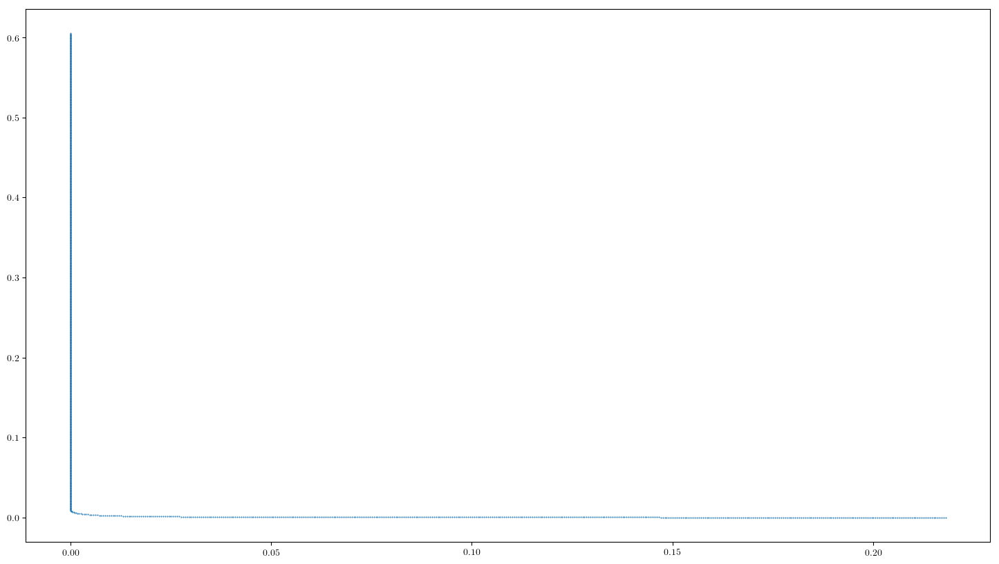

In [134]:
plt.figure()
plt.scatter(strainlines[strainlineno][0],strainlines[strainlineno][1],s=1,marker='.')

In [31]:
b = strainlines[76][:,:startpoint_indices[76]]
f = strainlines[76][:,startpoint_indices[76]:]

In [34]:
b[:,-1]

array([ 0.33729823,  0.72673241])

In [32]:
f

array([[ 0.33708131,  0.33686543,  0.33665058, ...,  0.33708131,
         0.33729823,  0.33751618],
       [ 0.72628191,  0.72583092,  0.72537943, ...,  0.72628191,
         0.72673241,  0.7271824 ]])

In [228]:
def foo():
    strainlines = []
    n_proc = 4
    padding_factor=0.01
    max_iter = 1000
    stride = 0.0005
    l_f_max = 0.3
    l_min = 1
    tol_alpha = 1e-6
    
    line = []

    in_AB_domain = InABDomain(np.reshape(grid,(2,nx,ny)),np.reshape(lmbd1,(nx,ny)),np.reshape(lmbd2,(nx,ny)),np.reshape(lapl_lmbd2,(nx,ny)),np.reshape(xi2,(2,nx,ny)),x_min,x_max,y_min,y_max,padding_factor)
    in_numerical_domain = InNumericalDomain(x_min,x_max,y_min,y_max,nx,ny)

    lmbd1_spline = RectBivariateSpline(np.reshape(grid,(2,nx,ny))[1,0,:],np.reshape(grid,(2,nx,ny))[0,:,0],np.reshape(lmbd1,(nx,ny)).T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)
    lmbd2_spline = RectBivariateSpline(np.reshape(grid,(2,nx,ny))[1,0,:],np.reshape(grid,(2,nx,ny))[0,:,0],np.reshape(lmbd2,(nx,ny)).T,bbox=[y_min-(y_max-y_min)*padding_factor,y_max+(y_max-y_min)*padding_factor,x_min-(x_max-x_min)*padding_factor,x_max+(x_max-x_min)*padding_factor],kx=1,ky=1)

    rhs_f = LinearSpecialDerivative(np.reshape(grid,(2,nx,ny)),np.reshape(xi1,(2,nx,ny)))
    rhs_b = LinearSpecialDerivative(np.reshape(grid,(2,nx,ny)),np.reshape(xi1,(2,nx,ny)))
    alpha = Alpha(lmbd1_spline,lmbd2_spline)   
    
    #return iteratestrainline(g0[:,lineno],max_iter,rhs_f,rhs_b,integrator,stride,l_f_max,l_min,alpha,tol_alpha,in_AB_domain,in_numerical_domain,lmbd2_spline)

    partition = np.floor(np.size(g0,1)/n_proc).astype(int)
    
    qlist = [mp.Queue() for j in range(n_proc)]
    plist = [mp.Process(target=computestrainlines,
                       args = (g0[:,j*partition:np.size(g0,1) if j+1 is n_proc else (j+1)*partition],
                              max_iter,rhs_f,rhs_b,stride,l_f_max,l_min,alpha,tol_alpha,in_AB_domain,in_numerical_domain,lmbd2_spline,j,qlist[j])) 
             for j in range(n_proc)]
    tic = time.time()
    for p in plist:
        p.start()
    for q in qlist:
        strainlines = strainlines + q.get()
    for p in plist:
        p.join()
    print(time.time()-tic)  
    return strainlines

In [ ]:
b = a.reshape((2,1))

In [ ]:
b.reshape((2))

In [324]:
rhs_f = LinearSpecialDerivative(grid.reshape(2,nx,ny),xi1.reshape(2,nx,ny))
rhs_b = LinearSpecialDerivative(grid.reshape(2,nx,ny),xi1.reshape(2,nx,ny))
alpha = Alpha(lmbd1_spline,lmbd2_spline)

strainlineno=85

#Strainline 85 is an LCS!
#Strainline 236 is an LCS!
#Strainline 657 is an LCS!
#Strainline 1362 is an LCS!

in_ab = InABDomain(grid.reshape(2,nx,ny),lmbd1.reshape(nx,ny),lmbd2.reshape(nx,ny),lapl_lmbd2.reshape(nx,ny),xi2.reshape(2,nx,ny),x_min,x_max,y_min,y_max)
in_domain = InNumericalDomain(x_min,x_max,y_min,y_max,nx,ny)
line = iteratestrainline(g0[:,strainlineno],10000,rhs_f,rhs_b,0.0005,0.3,1.,alpha,10**-6,in_ab,in_domain,lmbd2_spline)

(0.95, 1.05)

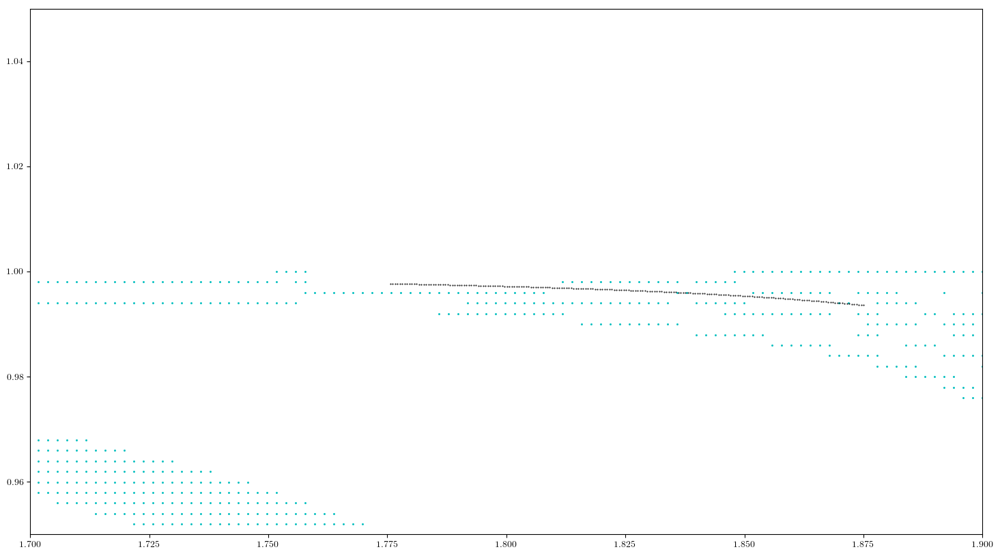

In [364]:
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='c',marker='.',s=5)
#plt.scatter(line.pos[0,:line.startpoint_index],line.pos[1,:line.startpoint_index],c='tomato',marker='.',s=1)
plt.scatter(line.pos[0,line.startpoint_index:][5050:5250],line.pos[1,line.startpoint_index:][5050:5250],c='k',marker='.',s=1)
plt.xlim(1.7,1.9)
plt.ylim(0.95,1.05)

In [390]:
line.pos[:,line.startpoint_index:line.startpoint_index+1].T

array([[ 0.16016016,  0.6012024 ]])

In [175]:
nmn2 = 79
g0[:,nmn2:nmn2+1]
# X = 0.148114815
# Y = 0.4008016

array([[ 0.14814815],
       [ 0.4008016 ]])

In [176]:
strainlines[nmn2].len

7.0034954667317457

In [203]:

#strainlines[nmn2].avg_lmbd2()
lf_avg = np.average(strainlines[nmn2].lmbd2_spline.ev(strainlines[nmn2].pos[1,strainlines[nmn2].startpoint_index+1:-1],strainlines[nmn2].pos[0,strainlines[nmn2].startpoint_index+1:-1]))

In [204]:
lb_avg = np.average(strainlines[nmn2].lmbd2_spline.ev(strainlines[nmn2].pos[1,:strainlines[nmn2].startpoint_index+1],strainlines[nmn2].pos[0,:strainlines[nmn2].startpoint_index+1]))

In [207]:
l_avg = (lf_avg*strainlines[nmn2].pos[:,strainlines[nmn2].startpoint_index+1:-1].shape[1] + lb_avg*strainlines[nmn2].pos[:,:strainlines[nmn2].startpoint_index+1].shape[1])/strainlines[nmn2].pos.shape[1]

In [209]:
strainlines[nmn2].stationary

array([False, False], dtype=bool)

In [210]:
strainlines[nmn2].outs_dom

array([False, False], dtype=bool)

In [211]:
strainlines[nmn2].cont_failure

array([ True,  True], dtype=bool)

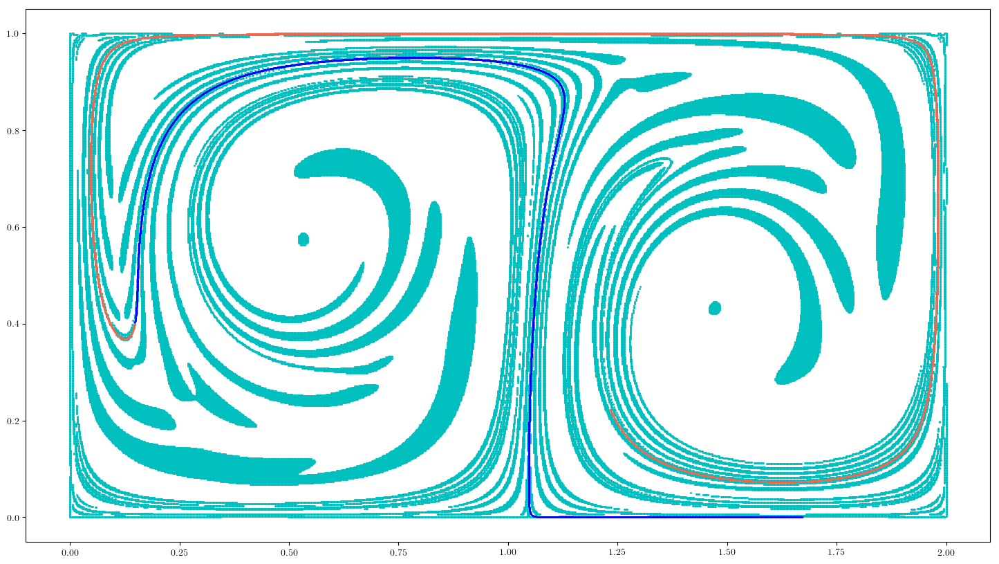

In [178]:
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=5,c='c',marker='.')
plt.scatter(strainlines[nmn2].pos[0,:strainlines[nmn2].startpoint_index],strainlines[nmn2].pos[1,:strainlines[nmn2].startpoint_index],c='blue',s=1,marker='.')
plt.scatter(strainlines[nmn2].pos[0,strainlines[nmn2].startpoint_index:],strainlines[nmn2].pos[1,strainlines[nmn2].startpoint_index:],c='tomato',s=1,marker='.')

In [323]:
print(line.pos[:,-10:].T)
print('-------------------------')
print(line.pos[:,:10][:,::-1].T)

[[ 0.00258308  0.68300337]
 [ 0.00258356  0.68350337]
 [ 0.00258404  0.68400337]
 [ 0.00258453  0.68450337]
 [ 0.00258503  0.68500337]
 [ 0.00258553  0.68550336]
 [ 0.00258604  0.68600336]
 [ 0.00258656  0.68650336]
 [ 0.00258708  0.68700336]
 [ 0.00258762  0.68750336]]
-------------------------
[[ 0.54297003  0.29846383]
 [ 0.54345332  0.29833563]
 [ 0.54393644  0.29820682]
 [ 0.5444194   0.2980774 ]
 [ 0.5449022   0.29794738]
 [ 0.54538483  0.29781672]
 [ 0.54586729  0.29768545]
 [ 0.54634958  0.29755356]
 [ 0.5468317   0.29742105]
 [ 0.54731365  0.29728791]]


In [192]:
strainlines[nmn2].pos[:,-10:].T

array([[ 1.234968  ,  0.21953863],
       [ 1.23475126,  0.21998921],
       [ 1.23453547,  0.22044025],
       [ 1.23432064,  0.22089174],
       [ 1.23410676,  0.22134369],
       [ 1.23389383,  0.22179609],
       [ 1.23368184,  0.22224892],
       [ 1.23347078,  0.22270219],
       [ 1.23326064,  0.22315589],
       [ 1.23305141,  0.22361001]])

In [191]:
strainlines[nmn2].pos[:,0:10].T

array([[  1.67186423e+00,   1.42218196e-05],
       [  1.67136423e+00,   1.42185129e-05],
       [  1.67086423e+00,   1.42152494e-05],
       [  1.67036423e+00,   1.42120289e-05],
       [  1.66986423e+00,   1.42088515e-05],
       [  1.66936423e+00,   1.42057171e-05],
       [  1.66886423e+00,   1.42026255e-05],
       [  1.66836423e+00,   1.41995767e-05],
       [  1.66786423e+00,   1.41965707e-05],
       [  1.66736423e+00,   1.41936074e-05]])

In [233]:
strainlines = foo()

Process 1: Finished integrating strainline candidate 85 of 341
Process 3: Finished integrating strainline candidate 85 of 342
Process 0: Finished integrating strainline candidate 85 of 341
Process 2: Finished integrating strainline candidate 85 of 341
Process 1: Finished integrating strainline candidate 170 of 341
Process 1: Finished integrating strainline candidate 255 of 341
Process 3: Finished integrating strainline candidate 170 of 342
Process 2: Finished integrating strainline candidate 170 of 341
Process 0: Finished integrating strainline candidate 170 of 341
Process 1: Finished integrating strainline candidate 340 of 341
Process 3: Finished integrating strainline candidate 255 of 342
Process 0: Finished integrating strainline candidate 255 of 341
Process 2: Finished integrating strainline candidate 255 of 341
Process 3: Finished integrating strainline candidate 340 of 342
Process 0: Finished integrating strainline candidate 340 of 341
Process 2: Finished integrating strainline c

In [ ]:
strainlines[1].pos

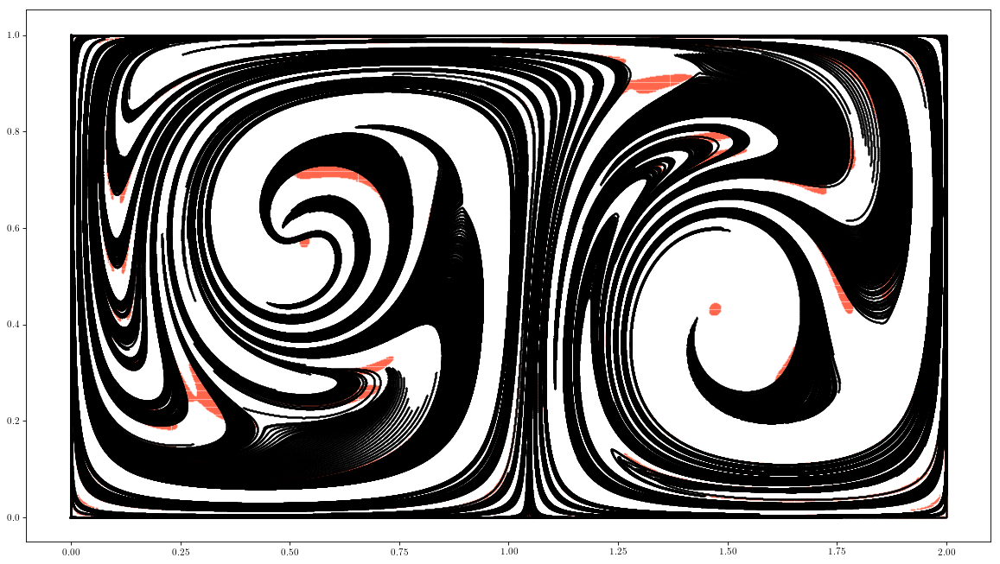

In [438]:
plt.figure(figsize=(18,10),dpi=80,facecolor='w',edgecolor='k')
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='tomato',s=1,marker='.')
for strainline in strainlines:
    plt.scatter(strainline.pos[0,:strainline.startpoint_index],strainline.pos[1,:strainline.startpoint_index],c='k',s=1,marker='.')
    plt.scatter(strainline.pos[0,strainline.startpoint_index:],strainline.pos[1,strainline.startpoint_index:],c='k',s=1,marker='.')

In [234]:
def find_vert_and_horz_lines(pos_init,nx,ny,num_horz,num_vert):
    pos_init = pos_init.reshape(2,nx,ny)
    stride_horz = np.floor(np.size(pos_init,1)/(num_horz+1)).astype(int)
    stride_vert = np.floor(np.size(pos_init,2)/(num_vert+1)).astype(int)
    
    vert_x = np.empty(num_vert)
    horz_y = np.empty(num_horz)
    
    for j in range(num_vert):
        vert_x[j] = pos_init[0,(j+1)*stride_horz,0]
        
    for j in range(num_horz):
        horz_y[j] = pos_init[1,0,(j+1)*stride_vert]
    
    return vert_x,horz_y

In [235]:
vert_x, horz_y = find_vert_and_horz_lines(grid,nx,ny,num_horz,num_vert)

In [153]:
grid.shape

(2, 20000)

In [ ]:
#def find_intersections(strainlines,pos_init,nx,ny,num_horz,num_vert,max_isect_guess=5):
#    vert_x,horz_y = find_vert_and_horz_lines(pos_init,nx,ny,num_horz,num_vert)
#    n_strainlines = len(strainlines)
#    isect_horz = np.zeros((num_horz,n_strainlines,2,max_isect_guess))
#    isect_vert = np.zeros((num_vert,n_strainlines,2,max_isect_guess))
#    #isect_horz = np.ones((num_horz,n_strainlines,2,max_isect_guess),dtype=float)*-1
#    #isect_vert = np.ones((num_vert,n_strainlines,2,max_isect_guess),dtype=float)*-1
#    counter_horz = np.zeros((num_horz,n_strainlines),dtype=int)
#    counter_vert = np.zeros((num_vert,n_strainlines),dtype=int)
#    for i in range(n_strainlines):
#        traj = strainlines[i].pos
#        for j in range(num_horz):
#            for k in range(np.size(traj,1)-1):
#                if (traj[1,k]-horz_y[j])*(traj[1,k+1]-horz_y[j])<=0:
#                    wk = (traj[1,k+1]-horz_y[j])/(traj[1,k+1]-traj[1,k])
#                    xcoord = wk*traj[0,k]+(1-wk)*traj[0,k+1]
#                    isect_horz[j,i,0,counter_horz[j,i]] = xcoord
#                    isect_horz[j,i,1,counter_horz[j,i]] = horz_y[j]
#                    counter_horz[j,i] = counter_horz[j,i]+1
#                    if counter_horz[j,i]>=max_isect_guess:
#                        isect_horz = np.append(isect_horz,np.zeros((num_horz,n_strainlines,1)),2)
#        for j in range(num_vert):
#            for k in range(np.size(traj,1)-1):
#                if (traj[0,k]-vert_x[j])*(traj[0,k+1]-vert_x[j])<=0:
#                    wk = (traj[0,k+1]-vert_x[j])/(traj[0,k+1]-traj[0,k])
#                    ycoord = wk*traj[1,k]+(1-wk)*traj[1,k+1]
#                    isect_vert[j,i,0,counter_horz[j,i]] = vert_x[j]
#                    isect_vert[j,i,1,counter_horz[j,i]] = ycoord
#                    counter_vert[j,i] = counter_vert[j,i] + 1
#                    if counter_vert[j,i]>=max_isect_guess:
#                        isect_vert = np.append(isect_vert,np.zeros((num_vert,n_strainlines,1)),2)
#    return isect_horz,isect_vert     

In [ ]:
#%load_ext line_profiler

In [ ]:
#%lprun -f find_intersections find_intersections(strainlines,grid,nx,ny,num_horz,num_vert)

In [ ]:
#%lprun -f find_intersections2 find_intersections2(strainlines,grid,nx,ny,num_horz,num_vert)

In [ ]:
#isect_horz,isect_vert = find_intersections(strainlines,grid,nx,ny,num_horz,num_vert)

In [237]:
isect_horz,isect_vert = find_intersections(strainlines,grid,nx,ny,num_horz,num_vert)

In [257]:
nb = find_neighbors(strainlines,num_horz,num_vert,isect_horz,isect_vert,l_n=0.25)

Process 3: Found neighbors for 85 of 342 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 341 strainlines
Process 3: Found neighbors for 340 of 342 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Neighbors found in 4.0 minutes and 39.8217468262 seconds


In [216]:
np.shape(nb)

(299, 8)

In [258]:
LCSs = findLCSs(strainlines,nb,num_horz,num_vert)

FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 623 is an LCS!
Strainline 657 is an LCS!
Strainline 1362 is an LCS!
5


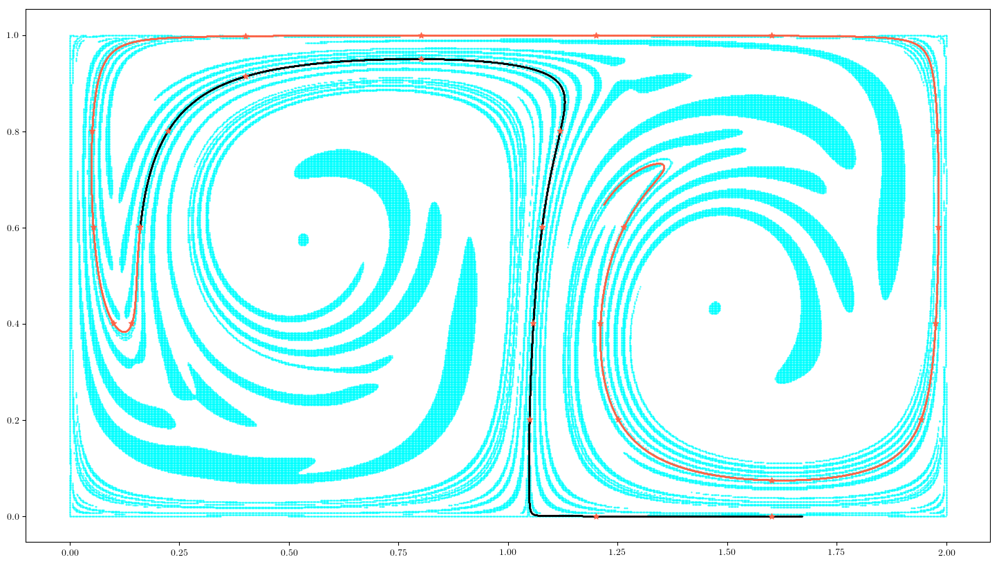

In [437]:
strainlineno = 85
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='cyan',s=1,marker='.')
plt.scatter(strainlines[strainlineno].pos[0,strainlines[strainlineno].startpoint_index:],strainlines[strainlineno].pos[1,strainlines[strainlineno].startpoint_index:],s=1,marker='.',c='tomato')
plt.scatter(strainlines[strainlineno].pos[0,:strainlines[strainlineno].startpoint_index],strainlines[strainlineno].pos[1,:strainlines[strainlineno].startpoint_index],s=1,marker='.',c='k')
for j in range(num_horz):
    plt.scatter(isect_horz[strainlineno][j][0],isect_horz[strainlineno][j][1],marker='*',c='tomato')
for j in range(num_vert):
    plt.scatter(isect_vert[strainlineno][j][0],isect_vert[strainlineno][j][1],marker='*',c='tomato')
    
#plt.xlim(1.25,1.45)
#plt.ylim(0.15,0.4)

In [303]:
strainlines[strainlineno].pos[:,-10:].T

array([[ 0.00258308,  0.68300337],
       [ 0.00258356,  0.68350337],
       [ 0.00258404,  0.68400337],
       [ 0.00258453,  0.68450337],
       [ 0.00258503,  0.68500337],
       [ 0.00258553,  0.68550336],
       [ 0.00258604,  0.68600336],
       [ 0.00258656,  0.68650336],
       [ 0.00258708,  0.68700336],
       [ 0.00258762,  0.68750336]])

In [304]:
strainlines[strainlineno].pos.shape


(2, 7388)

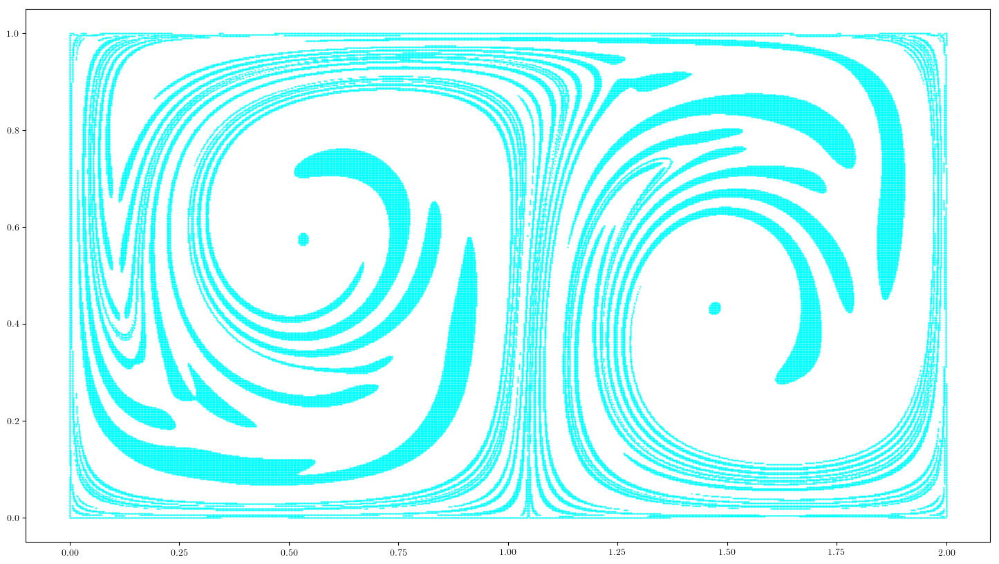

In [276]:
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='cyan',s=1,marker='.')

In [286]:
np.sum(mask_ab)

126649

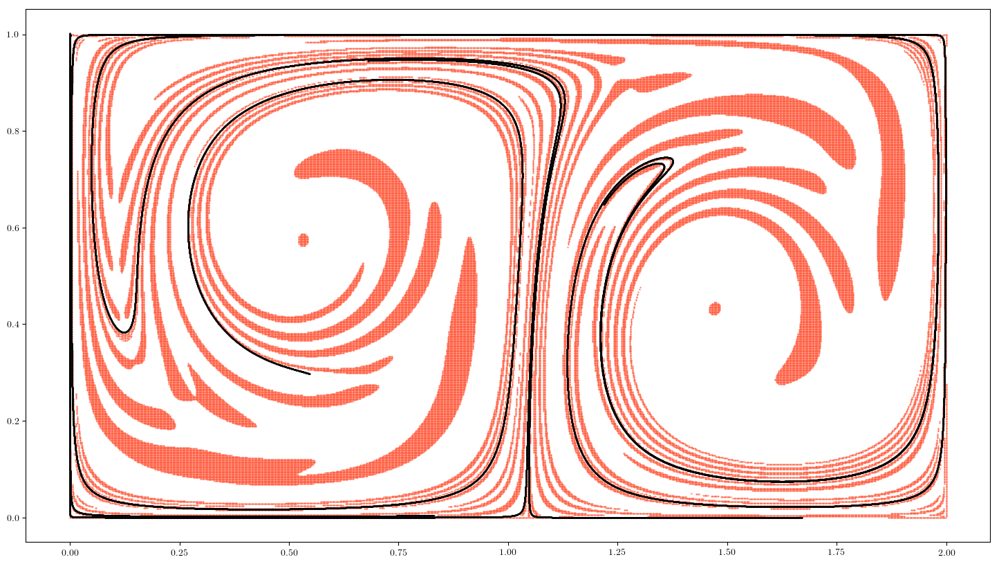

In [259]:
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='tomato',s=1,marker='.')
for j in range(len(LCSs)):
    plt.scatter(LCSs[j][0],LCSs[j][1],s=1,marker='.',c='k')

Process 3: Found neighbors for 85 of 342 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 341 strainlines
Process 3: Found neighbors for 340 of 342 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Neighbors found in 4.0 minutes and 38.9709839821 seconds


FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 608 is an LCS!
Strainline 623 is an LCS!
Strainline 657 is an LCS!
Strainline 697 is an LCS!
Strainline 707 is an LCS!
Strainline 1362 is an LCS!
8
Process 1: Found neighbors for 85 of 341 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 3: Found neighbors for 85 of 342 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 

FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 623 is an LCS!
Strainline 657 is an LCS!
Strainline 697 is an LCS!
Strainline 1362 is an LCS!
6
Process 0: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 3: Found neighbors for 85 of 342 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 341 strainlines
Process 3: Found neighbors for 340 o

FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 623 is an LCS!
Strainline 657 is an LCS!
Strainline 697 is an LCS!
Strainline 1362 is an LCS!
6
Process 3: Found neighbors for 85 of 342 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Process 3: Found neighbors for 340 of 342 strainlines
Process 0: Found neighbors for 340 o

FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 623 is an LCS!
Strainline 657 is an LCS!
Strainline 697 is an LCS!
Strainline 1362 is an LCS!
6
Process 3: Found neighbors for 85 of 342 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 341 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Process 3: Found neighbors for 340 o

FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 623 is an LCS!
Strainline 657 is an LCS!
Strainline 1362 is an LCS!
5
Process 3: Found neighbors for 85 of 342 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 341 strainlines
Process 3: Found neighbors for 340 of 342 strainlines
Neighbor

FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 623 is an LCS!
Strainline 657 is an LCS!
Strainline 1362 is an LCS!
5
Process 3: Found neighbors for 85 of 342 strainlines
Process 0: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 85 of 341 strainlines
Process 2: Found neighbors for 85 of 341 strainlines
Process 1: Found neighbors for 170 of 341 strainlines
Process 3: Found neighbors for 170 of 342 strainlines
Process 2: Found neighbors for 170 of 341 strainlines
Process 0: Found neighbors for 170 of 341 strainlines
Process 1: Found neighbors for 255 of 341 strainlines
Process 0: Found neighbors for 255 of 341 strainlines
Process 3: Found neighbors for 255 of 342 strainlines
Process 2: Found neighbors for 255 of 341 strainlines
Process 1: Found neighbors for 340 of 341 strainlines
Process 0: Found neighbors for 340 of 341 strainlines
Process 3: Found neighbors for 340 of 342 strainlines
Process 2: Found neighbors for 340 of 341 strainlines
Neighbor

FloatProgress(value=0.0, max=1365.0)

Strainline 85 is an LCS!
Strainline 236 is an LCS!
Strainline 657 is an LCS!
Strainline 1362 is an LCS!
4


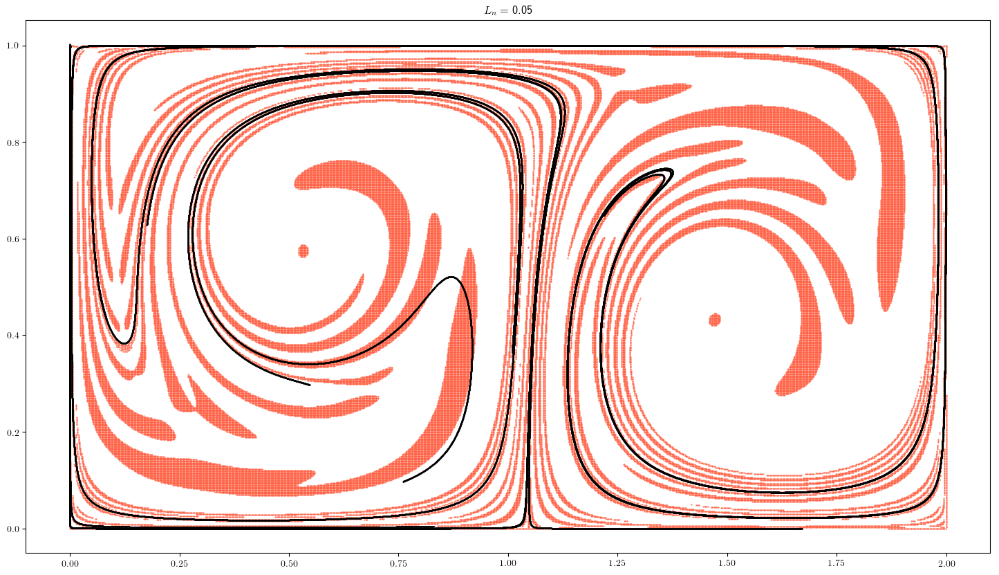

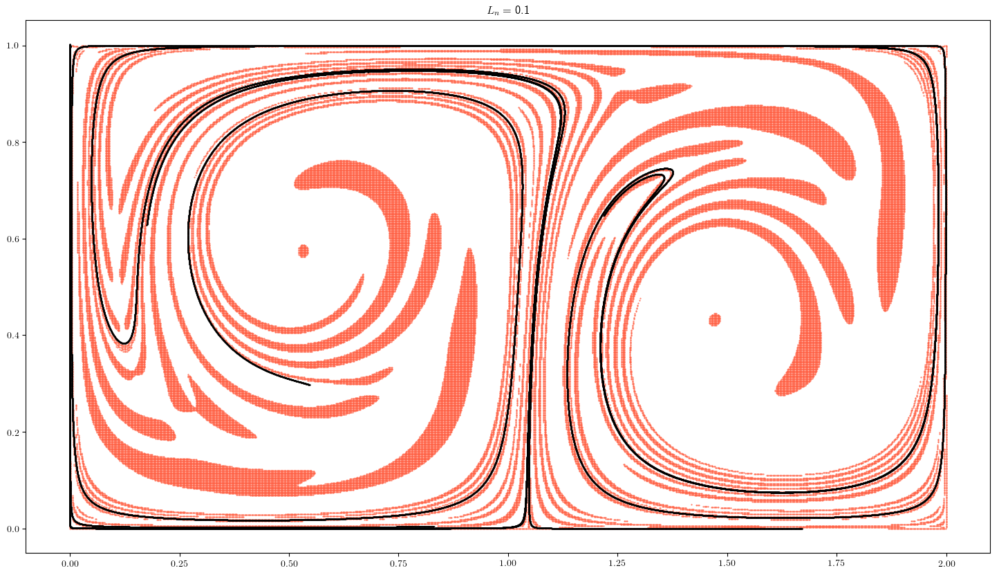

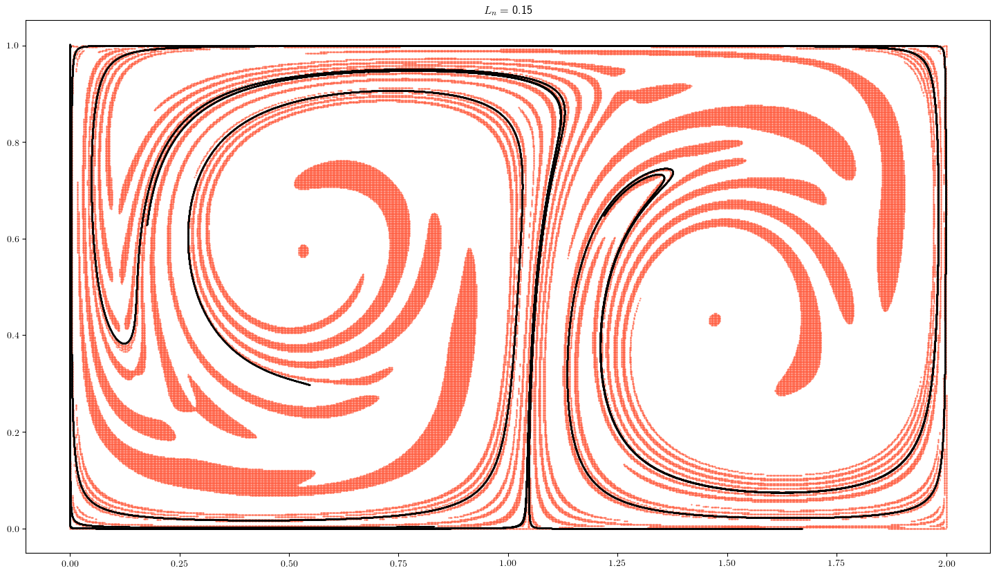

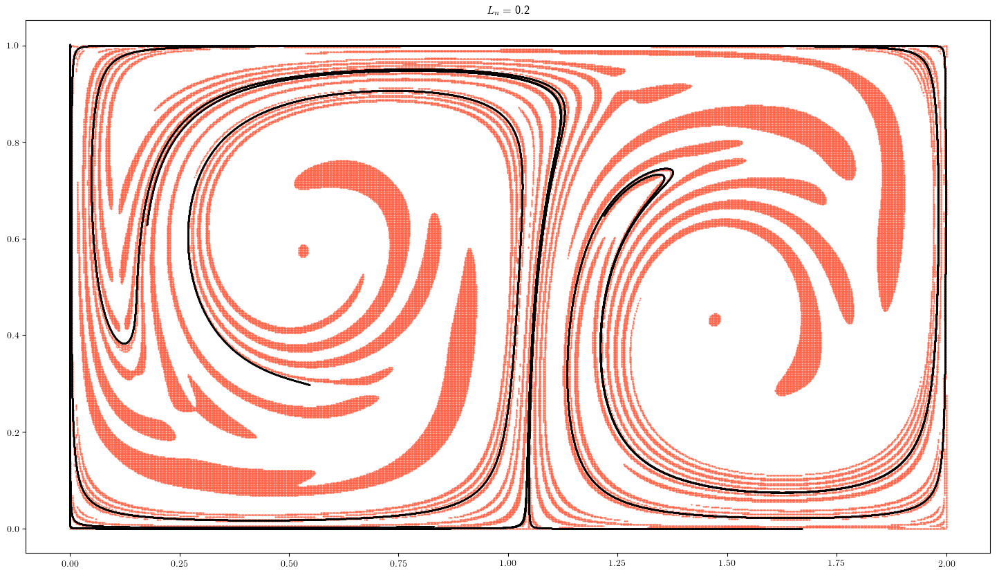

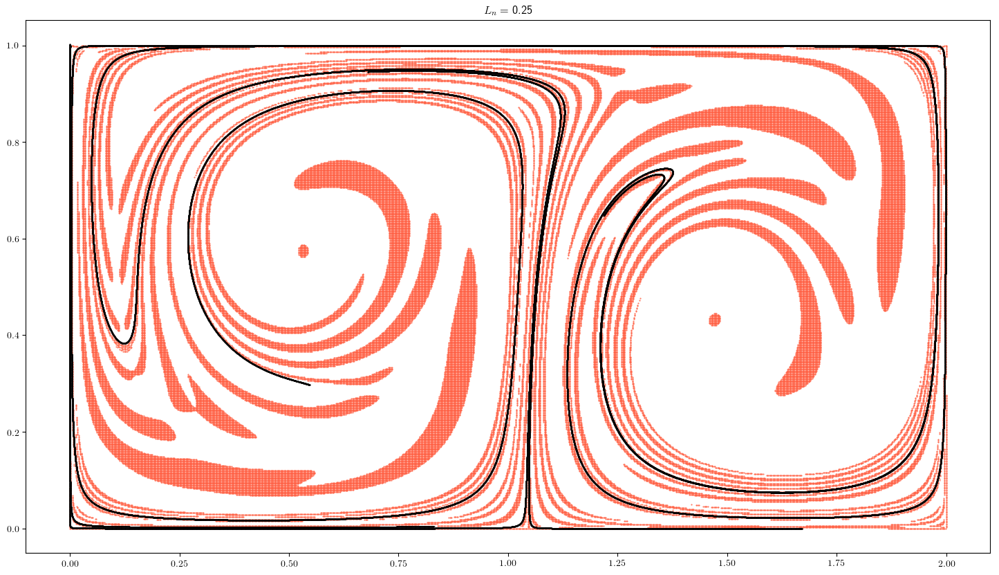

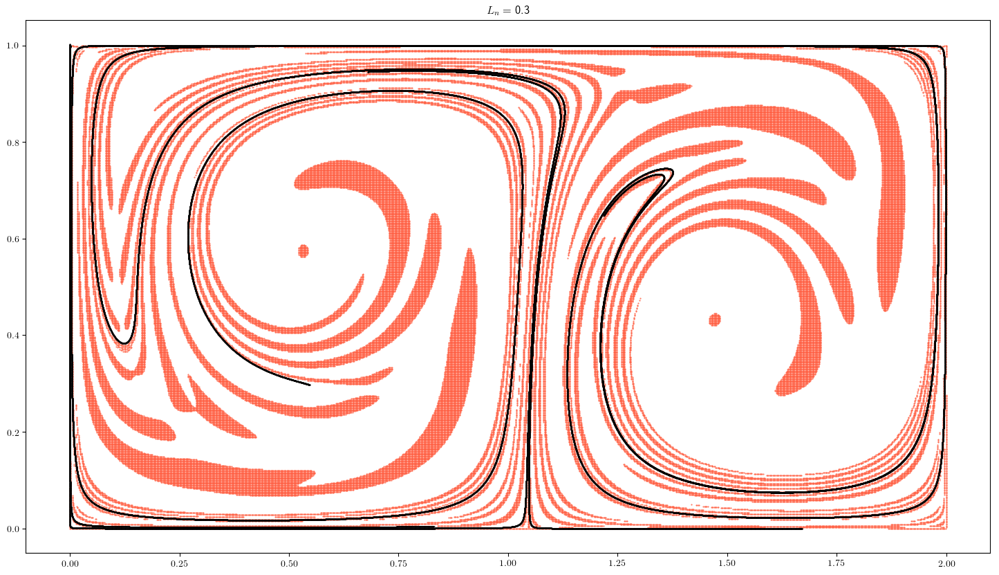

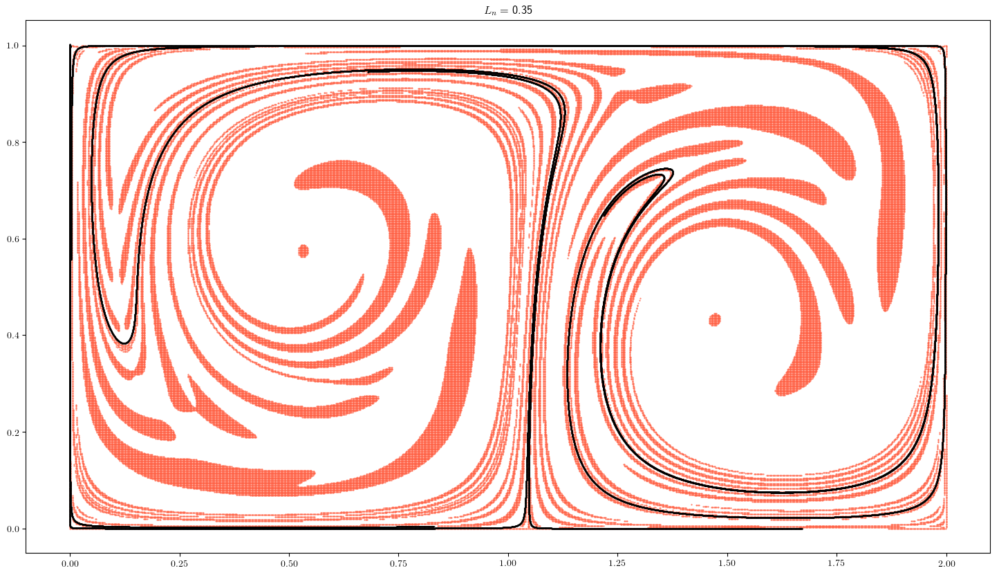

In [263]:
lns = [0.05,0.10,0.15,0.20,0.25,0.30,0.35]
    for l_n in lns:
    nb = find_neighbors(strainlines,num_horz,num_vert,isect_horz,isect_vert,l_n=l_n)
    LCSs = findLCSs(strainlines,nb,num_horz,num_vert)
    plt.figure()
    plt.scatter(grid[0,mask_ab],grid[1,mask_ab],c='tomato',s=1,marker='.')
    for j in range(len(LCSs)):
        plt.scatter(LCSs[j][0],LCSs[j][1],s=1,marker='.',c='k')
    plt.title(r'$L_n=$ {}'.format(l_n))

In [265]:
ensure_path_exists('precomputed_strainlines/{}/'.format(integrator.__name__))
np.save('precomputed_strainlines/{}/Nx={},Ny={},d={},max_iter={},l_f={}.npy'.format(integrator.__name__,nx,ny,0.0005,10000,0.2),strainlines)

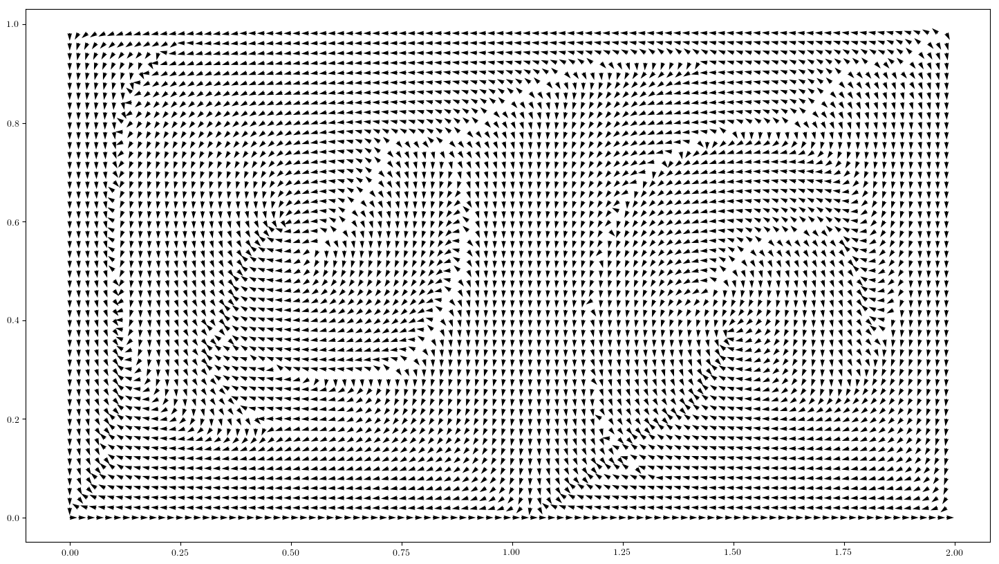

In [320]:
plt.figure()
plt.quiver(grid.reshape(2,nx,ny)[0,::10,::10],grid.reshape(2,nx,ny)[1,::10,::10],xi1.reshape(2,nx,ny)[0,::10,::10],xi1.reshape(2,nx,ny)[1,::10,::10])

In [ ]:
strainlineno = 120
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,c='b',alpha=0.3)
plt.scatter(strainlines[strainlineno].pos[0],strainlines[strainlineno].pos[1],s=1,marker='.',c='c')
for j in range(num_vert):
    mask = np.greater(isect_vert[j,strainlineno,0],-1)
    if np.any(mask):
        plt.scatter(isect_vert[j,strainlineno,0][mask],isect_vert[j,strainlineno,1][mask],s=12,marker='*',c='tomato')
        
for j in range(num_horz):
    mask = np.greater(isect_horz[j,strainlineno,0],-1)
    if np.any(mask):
        plt.scatter(isect_horz[j,strainlineno,0][mask],isect_horz[j,strainlineno,1][mask],s=12,marker='*',c='k')
    

In [ ]:
strainlineno = 120
plt.figure()
plt.scatter(grid[0,mask_ab],grid[1,mask_ab],s=1,c='b',alpha=0.3)
plt.scatter(strainlines[strainlineno].pos[0],strainlines[strainlineno].pos[1],s=1,marker='.',c='c')
for j in range(num_vert):
    if np.size(isect_vert2[strainlineno][j][0]) > 0:
        plt.scatter(isect_vert2[strainlineno][j][0],isect_vert2[strainlineno][j][1],marker='*',s=12,c='tomato')
        
for j in range(num_horz):
    if np.size(isect_horz2[strainlineno][j][0]) > 0:
        plt.scatter(isect_horz2[strainlineno][j][0],isect_horz2[strainlineno][j][1],marker='*',s=12,c='k')
#plt.scatter(isect_horz[0,0],np.ones(np.size(isect_horz[0,0]))*horz_y[0],marker='*',s=12,c='tomato')

In [ ]:
strainlines[strainlineno].pos[:,strainlines[strainlineno].startpoint_index]

In [ ]:
len(strainlines)

In [ ]:
strainlines[strainlineno].pos[:,strainlines[strainlineno].startpoint_index]

In [ ]:
vert_x

In [ ]:
horz_y

In [ ]:
a = [[[] for q in range(2)] for j in range(3)]

In [ ]:
a

In [ ]:
a[0]

In [ ]:
np.size(a[0][0])

In [ ]:
progressbar = FloatProgress(min=0,max=len(strainlines))
display(progressbar)

In [266]:
ksi = np.load('precomputed_strainlines/rk4/Nx=1000,Ny=500,d=0.0005,max_iter=10000,l_f=0.2.npy')

In [267]:
ksi.dtype

dtype('O')

In [270]:
ksi[0].avg_lmbd2()

703277.91805078078

In [441]:
kxi = np.empty((2,nx,ny))
kxi[0] = xi1[0].reshape(nx,ny)
kxi[1] = xi1[1].reshape(nx,ny)

In [445]:
kxi[:,200,200]

array([-0.85548542,  0.51782689])

In [446]:
kxiZ = np.load('eigvec1.npy')

In [447]:
kxiZ.shape

(2, 500, 1000)

In [475]:
kxiZ2 = np.empty((2,1000,500))
kxiZ2[1] = kxiZ[0].T
kxiZ2[0] = kxiZ[1].T

In [453]:
kxiZ2[:,0,0]

array([ 1.,  0.])

In [467]:
np.sum(np.equal(kxiZ2[0,0,1],kxi[0,0,1]))

0

In [460]:
np.sum(np.equal(kxiZ2[1],kxi[1]))

2240

In [461]:
kxiZ2[:,-1,-1]

array([ 0.,  1.])

In [462]:
kxi[:,-1,-1]

array([ 0.,  1.])

In [463]:
kxiZ2[:,55,45]

array([-0.83956212,  0.54326369])

In [464]:
kxi[:,55,45]

array([-0.83956212,  0.54326369])

In [468]:
kxiZ2[0,0,1]

-3.1167700141820285e-15

In [469]:
kxi[0,0,1]

-3.116770014182146e-15

In [476]:
kxi = 10**-16*(np.trunc(kxi*10**16))
kxiZ2 = 10**-16*(np.trunc(kxiZ2*10**16))

In [477]:
kxi[0,0,1]

-3.0999999999999999e-15

In [478]:
kxiZ2[0,0,1]

-3.0999999999999999e-15

In [483]:
np.sum(np.equal(kxi[0][1][0],kxiZ2[0][1][0]))

1

In [488]:
kxi[0][1][4]

0.3909214434108117

In [489]:
kxiZ2[0][1][4]

0.39092144340949508

In [546]:
def characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,integrator,stride,rhs,n_proc=4,atol=None,rtol=None):
    grid = padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max)
    dx_main = (x_max-x_min)/(nx-1)
    dy_main = (y_max-y_min)/(ny-1)
    
    dx_aux = np.minimum(1e-5,dx_main*1e-2)
    dy_aux = np.minimum(1e-5,dy_main*1e-2)
    
    pos_fin,jac_main,jac_aux,tens_main,tens_aux,lmbd1,lmbd2,lapl_lmbd2,xi1,xi2,lapl_xi2 = _characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,dx_main,dy_main,dx_aux,dy_aux,integrator,stride,rhs,n_proc,atol,rtol)
    
    return pos_fin,jac_main,jac_aux,tens_main,tens_aux,grid,lmbd1,lmbd2,lapl_lmbd2,xi1,xi2,lapl_xi2

def _characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,dx_main,dy_main,dx_aux,dy_aux,integrator,stride,rhs,n_proc,atol,rtol):
    if integrator.__name__ in fixed_step_integrators:
        try:
            grid = np.load('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_h={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,stride))
            print('Precomputed advection found! Advection not necessary!')
        except IOError:
            print('Precomputed advection not found! Advection necessary!')
            # Grid: Main -> Right -> Above -> Left -> Beneath
            grid = np.empty((5,2,(nx+4)*(ny+4)))
            grid[0] = padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max)
            grid[1] = grid[0]+np.array([dx_aux,0]).reshape(2,1)
            grid[2] = grid[0]+np.array([0,dy_aux]).reshape(2,1)
            grid[3] = grid[0]+np.array([-dx_aux,0]).reshape(2,1)
            grid[4] = grid[0]+np.array([0,-dy_aux]).reshape(2,1)
            
            grid = endpoints(t_start,t_end,grid,stride,integrator,rhs,n_proc,atol,rtol)
            np.save('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_h={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,stride),grid)
            print('Configuration now stored. Advection won\'t be necessary next time!')
    else:
        try:
            grid = np.load('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_atol={}_rtol={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,atol,rtol))
            print('Precomputed advection found! Advection not necessary!')
        except IOError:
            print('Precomputed advection not found! Advection necessary!')
            # Grid: Main -> Right -> Above -> Left -> Beneath
            grid = np.empty((5,2,(nx+4)*(ny+4)))
            grid[0] = padded_grid_of_particles(nx,ny,x_min,x_max,y_min,y_max)
            grid[1] = grid[0]+np.array([dx_aux,0]).reshape(2,1)
            grid[2] = grid[0]+np.array([0,dy_aux]).reshape(2,1)
            grid[3] = grid[0]+np.array([-dx_aux,0]).reshape(2,1)
            grid[4] = grid[0]+np.array([0,-dy_aux]).reshape(2,1)
            
            grid = endpoints(t_start,t_end,grid,stride,integrator,rhs,n_proc,atol,rtol)
            np.save('precomputed_advection/{}/advected_grid_Nx={}_Ny={}_dx_main={}_dy_main={}_dx_aux={}_dy_aux={}_t_start={}_t_end={}_atol={}_rtol={}.npy'.format(integrator.__name__,nx,ny,dx_main,dy_main,dx_aux,dy_aux,t_start,t_end,atol,rtol),grid)
            print('Configuration now stored. Advection won\'t be necessary next time!')
            
    jac_main,jac_aux,tens_main,tens_aux = _find_strain_tensors(grid,nx,ny,dx_main,dy_main,dx_aux,dy_aux)
    
    lmbd1,lmbd2,xi1,xi2 = _find_characteristics(tens_main,tens_aux)
    
    lapl_lmbd2,lapl_xi2 = _find_laplacians(lmbd2,xi2,nx,ny,dx_main,dy_main)
    
    return grid,jac_main,jac_aux,tens_main,tens_aux,lmbd1,lmbd2,lapl_lmbd2,xi1,xi2,lapl_xi2

def _find_strain_tensors(grid,nx,ny,dx_main,dy_main,dx_aux,dy_aux):
    grid_main = grid[0].reshape((2,nx+4,ny+4))
    grid_right = grid[1].reshape((2,nx+4,ny+4))
    grid_top = grid[2].reshape((2,nx+4,ny+4))
    grid_left = grid[3].reshape((2,nx+4,ny+4))
    grid_btm = grid[4].reshape((2,nx+4,ny+4))
    
    # Declare Jacobians
    df_m = np.empty((2,2,nx+4,ny+4))
    df_a = np.empty((2,2,nx+4,ny+4))
    
    # Use centered differencing throughout for auxiliary Jacobian:
    df_a[0,0,:,:] = (grid_right[0]-grid_left[0])/(2*dx_aux)
    df_a[0,1,:,:] = (grid_top[0]-grid_btm[0])/(2*dy_aux)
    df_a[1,0,:,:] = (grid_right[1]-grid_left[1])/(2*dx_aux)
    df_a[1,1,:,:] = (grid_top[1]-grid_btm[1])/(2*dy_aux)
    
    # Use centered differencing where applicable for main Jacobian,
    # second order backwards/forwards difference otherwise
    df_m[0,0,1:-1,:] = (grid_main[0,2:,:]-grid_main[0,0:-2,:])/(2*dx_main)
    df_m[0,0,0,:] = (-3*grid_main[0,0,:]+4*grid_main[0,1,:]-2*grid_main[0,2,:])/(2*dx_main)
    df_m[0,0,-1,:] = (3*grid_main[0,-1,:]-4*grid_main[0,-2,:]+2*grid_main[0,-3,:])/(2*dx_main)
    
    df_m[0,1,:,1:-1] = (grid_main[0,:,2:]-grid_main[0,:,0:-2])/(2*dy_main)
    df_m[0,1,:,0] = (-3*grid_main[0,:,0]+4*grid_main[0,:,1]-2*grid_main[0,:,2])/(2*dy_main)
    df_m[0,1,:,-1] = (3*grid_main[0,:,-1]-4*grid_main[0,:,-2]+2*grid_main[0,:,-3])/(2*dy_main)
    
    df_m[1,0,1:-1,:] = (grid_main[1,2:,:]-grid_main[1,0:-2,:])/(2*dx_main)
    df_m[1,0,0,:] = (-3*grid_main[1,0,:]+4*grid_main[1,1,:]-2*grid_main[1,2,:])/(2*dx_main)
    df_m[1,0,-1,:] = (3*grid_main[1,-1,:]-4*grid_main[1,-2,:]+2*grid_main[1,-3,:])/(2*dx_main)
    
    df_m[1,1,:,1:-1] = (grid_main[1,:,2:]-grid_main[1,:,0:-2])/(2*dy_main)
    df_m[1,1,:,0] = (-3*grid_main[1,:,0]+4*grid_main[1,:,1]-2*grid_main[1,:,2])/(2*dy_main)
    df_m[1,1,:,-1] = (3*grid_main[1,:,-1]-4*grid_main[1,:,-2]+2*grid_main[1,:,-3])/(2*dy_main)
    
    # Reshape Jacobian arrays:
    df_a = df_a.reshape((2,2,(nx+4)*(ny+4)))
    df_m = df_m.reshape((2,2,(nx+4)*(ny+4)))
    
    # Declare strain tensors:
    c_m = np.empty(np.shape(df_m))
    c_a = np.empty(np.shape(df_a))
    
    # Explicitly calculate strain tensors:
    for j in range((nx+4)*(ny+4)):
        c_m[:,:,j] = np.dot(df_m[:,:,j].T,df_m[:,:,j])
        c_a[:,:,j] = np.dot(df_a[:,:,j].T,df_a[:,:,j])
        
    return df_m,df_a,c_m,c_a

def _find_characteristics(tens_main,tens_aux):
    lmbd1 = np.empty(np.size(tens_main,2))
    lmbd2 = np.empty(np.shape(lmbd1))
    xi1 = np.empty((2,np.size(tens_main,2)))
    xi2 = np.empty(np.shape(xi1))
    
    for j in range(np.size(lmbd1)):
        # Linalg.eigh returns eigenvalues and vectors
        # sorted by increasing magnitude of eigenvalues
        vals, foo = np.linalg.eigh(tens_main[:,:,j])
        bar, vecs = np.linalg.eigh(tens_aux[:,:,j])
        
        lmbd1[j] = vals[0]
        lmbd2[j] = vals[1]
        
        xi1[:,j] = vecs[:,0]
        xi2[:,j] = vecs[:,1]
    
    return lmbd1,lmbd2,xi1,xi2

def _find_laplacians(lmbd,xi,nx,ny,dx_main,dy_main):
    lmbd_ = lmbd.reshape((nx+4,ny+4))
    xi_ = xi.reshape((2,nx+4,ny+4))
    
    lapl_lmbd = np.empty(np.shape(lmbd_))
    lapl_xi = np.empty(np.shape(xi_))
    
    # First direction:
    # Use centered differencing for internal points
    lapl_lmbd[1:-1,:] = (lmbd_[2:,:]-2*lmbd_[1:-1,:]+lmbd_[0:-2,:])/(dx_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_lmbd[0,:] = (2*lmbd_[0,:]-5*lmbd_[1,:]+4*lmbd_[2,:]-lmbd_[3,:])/(dx_main**2)
    lapl_lmbd[-1,:] = (2*lmbd_[-1,:]-5*lmbd_[-2,:]+4*lmbd_[-3,:]-lmbd_[-4,:])/(dx_main**2)
    
    # Second direction:
    # Use centered differencing for internal points
    lapl_lmbd[:,1:-1] += (lmbd_[:,2:]-2*lmbd_[:,1:-1]+lmbd_[:,0:-2])/(dy_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_lmbd[:,0] += (2*lmbd_[:,0]-5*lmbd_[:,1]+4*lmbd_[:,2]-lmbd_[:,3])/(dy_main**2)
    lapl_lmbd[:,-1] += (2*lmbd_[:,-1]-5*lmbd_[:,-2]+4*lmbd_[:,-3]-lmbd_[:,-4])/(dy_main**2)
    
    # First direction:
    # Use centered differencing for internal points
    lapl_xi[:,1:-1,:] = (xi_[:,2:,:]-2*xi_[:,1:-1,:]+xi_[:,0:-2,:])/(dx_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_xi[:,0,:] = (2*xi_[:,0,:]-5*xi_[:,1,:]+4*xi_[:,2,:]-xi_[:,3,:])/(dx_main**2)
    lapl_xi[:,-1,:] = (2*xi_[:,-1,:]-5*xi_[:,-2,:]+4*xi_[:,-3,:]-xi_[:,-4,:])/(dx_main**2)
    
    # Second direction:
    # Use centered differencing for internal points
    lapl_xi[:,:,1:-1] += (xi_[:,:,2:]-2*xi_[:,:,1:-1]+xi_[:,:,0:-2])/(dy_main**2)
    # Use second order accurate forwards/backwards differencing for domain edges:
    lapl_xi[:,:,0] += (2*xi_[:,:,0]-5*xi_[:,:,1]+4*xi_[:,:,2]-xi_[:,:,3])/(dy_main**2)
    lapl_xi[:,:,-1] += (2*xi_[:,:,-1]-5*xi_[:,:,-2]+4*xi_[:,:,-3]-xi_[:,:,-4])/(dy_main**2)
    
    lapl_lmbd = lapl_lmbd.reshape((nx+4)*(ny+4))
    lapl_xi = lapl_xi.reshape((2,(nx+4)*(ny+4)))
    
    return lapl_lmbd,lapl_xi
    

In [548]:
pos_fin_,jac_main_,jac_aux_,tens_main_,tens_aux_,grid_,lmbd1_,lmbd2_,lapl_lmbd2_,xi1_,xi2_,lapl_xi2_ = characteristics(t_start,t_end,nx,ny,x_min,x_max,y_min,y_max,integrator,h,doublegyre_wrapper)

Precomputed advection found! Advection not necessary!


In [554]:
jac_main = jac_main_[:,:,_inner_mask]
jac_aux = jac_aux_[:,:,_inner_mask]
tens_main = tens_main_[:,:,_inner_mask]
tens_aux = tens_aux_[:,:,_inner_mask]
grid = grid_[:,_inner_mask]
lmbd1 = lmbd1_[_inner_mask]
lmbd2 = lmbd2_[_inner_mask]
lapl_lmbd2 = lapl_lmbd2_[_inner_mask]
xi1 = xi1_[:,_inner_mask]
xi2 = xi2_[:,_inner_mask]
lapl_xi2 = lapl_xi2_[:,_inner_mask]
pos_fin = pos_fin_[0,:,_inner_mask].T

In [555]:
pos_fin.shape

(2, 500000)

In [510]:
c_m = np.load('C_reg.npy')

In [512]:
for i in range(2):
    for j in range(2):
        c_m[i,j] = c_m[i,j].reshape(ny,nx).T.flatten()

In [513]:
c_a = np.load('C_aux.npy')

In [514]:
for i in range(2):
    for j in range(2):
        c_a[i,j] = c_a[i,j].reshape(ny,nx).T.flatten()

In [516]:
tens_aux[:,:,0]

array([[  7.15745929e-18,   0.00000000e+00],
       [  0.00000000e+00,   9.99783157e+09]])

In [517]:
c_a[:,:,0]

array([[  7.15745929e-18,   0.00000000e+00],
       [  0.00000000e+00,   9.99783157e+09]])

In [519]:
tens_aux2 = 10**-16*(np.trunc(tens_aux*10**16))
c_a2 = 10**-16*(np.trunc(c_a*10**16))

In [520]:
np.sum(np.equal(tens_aux2,c_a2))

10837

In [521]:
pos_a = np.load('pos_a.npy')

In [522]:
pos_a.shape

(5, 2, 500000)

In [523]:
pos_a_m = pos_a[0,:,:]

In [524]:
for i in range(2):
    pos_a_m[i] = pos_a_m[i].reshape(ny,nx).T.flatten()

In [532]:
grid2 = 10**-12*np.trunc(grid*10**12)
pos_a_m2 = 10**-12*np.trunc(pos_a_m*10**12)

In [527]:
pos_a_m.shape

(2, 500000)

In [534]:
np.sum(np.equal(pos_a_m2[0],grid2[0]))

1

In [537]:
grid[:,240]

array([ 0.        ,  0.48096192])

In [538]:
pos_a_m[:,240]

array([ 1.,  0.])

In [542]:
pos_a_m = pos_a[0,:,:]
pos_a_m_2d = np.empty((2,500,1000))
for i in range(2):
    pos_a_m_2d[i] = pos_a_m[i].reshape(ny,nx)

In [543]:
grid_2D = grid.reshape(2,ny,nx)

In [556]:
pos_fin.reshape(2,nx,ny)[:,100,240]

array([ 0.85613517,  0.29611588])

In [557]:
pos_a_m_2d[:,240,100]

array([ 0.47376576,  0.72826659])

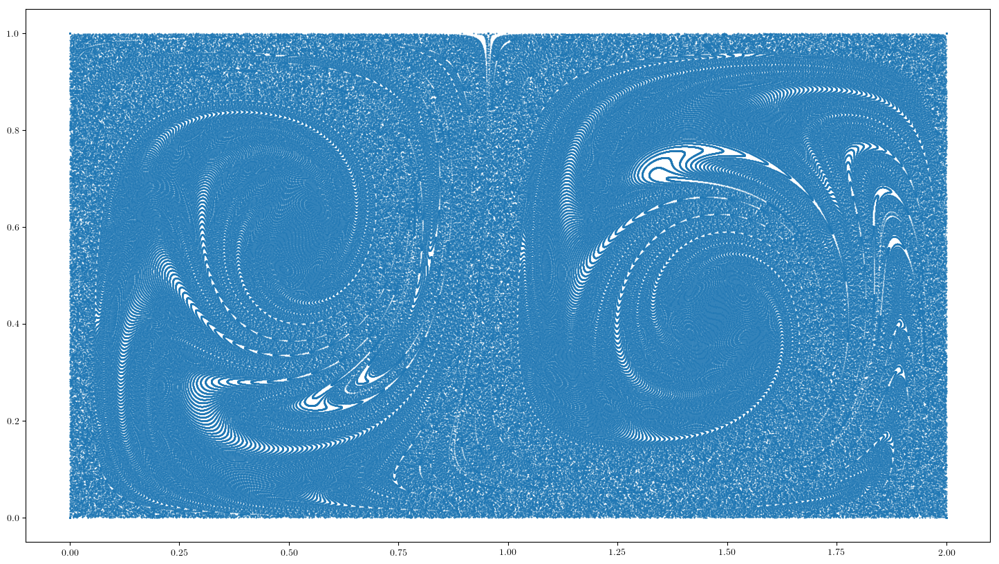

In [559]:
plt.figure()
plt.scatter(pos_fin[0],pos_fin[1],marker='.',s=1,)

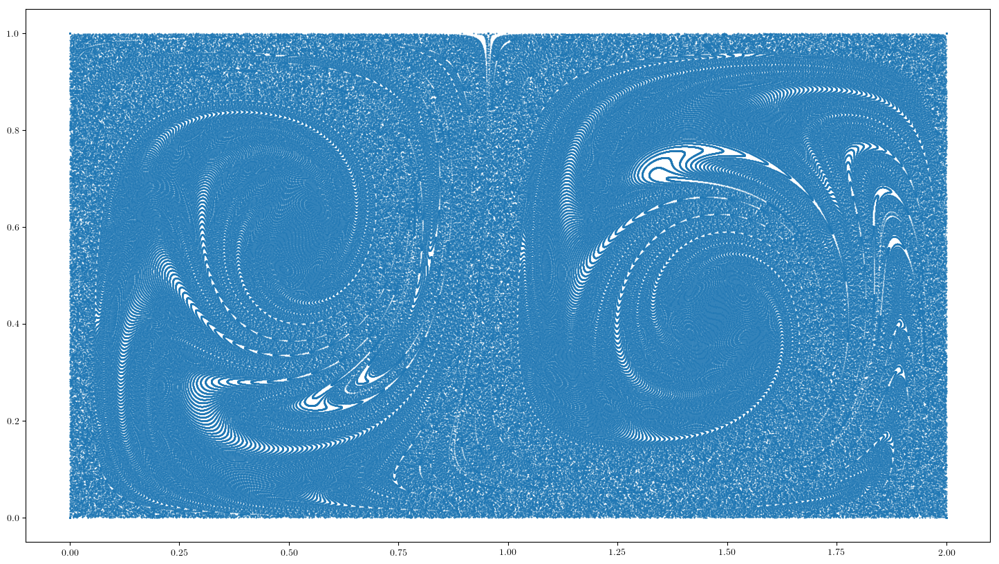

In [560]:
plt.figure()
plt.scatter(pos_a_m[1],pos_a_m[0],marker='.',s=1,)

In [561]:
pos_fin_2d = pos_fin.reshape(2,nx,ny)

In [563]:
pos_a_m_2d = np.empty((2,nx,ny))

pos_a_m_2d[1] = pos_a_m[0].reshape(ny,nx).T
pos_a_m_2d[0] = pos_a_m[1].reshape(ny,nx).T

In [572]:
xind = -1
yind = -1
pos_fin_2d[:,xind,yind]

array([ 2.,  1.])

In [573]:
pos_a_m_2d[:,xind,yind]

array([ 2.,  1.])

In [582]:
pos_fin[:,500]

array([  5.35548989e-12,   0.00000000e+00])

In [583]:
pos_a_m[::-1,1]

array([ 0.        ,  0.99999946])

In [587]:
grid[:,:10].T

array([[ 0.        ,  0.        ],
       [ 0.        ,  0.00200401],
       [ 0.        ,  0.00400802],
       [ 0.        ,  0.00601202],
       [ 0.        ,  0.00801603],
       [ 0.        ,  0.01002004],
       [ 0.        ,  0.01202405],
       [ 0.        ,  0.01402806],
       [ 0.        ,  0.01603206],
       [ 0.        ,  0.01803607]])

In [593]:
grid[:,25050].T

array([ 0.1001001,  0.1002004])

In [589]:
pos_a_m.shape

(2, 500000)

In [616]:
pos_a_m[::-1,50050].T

array([ 0.40677479,  0.17485521])

In [594]:
pos_fin[:,25050].T

array([ 0.42839726,  0.2437364 ])

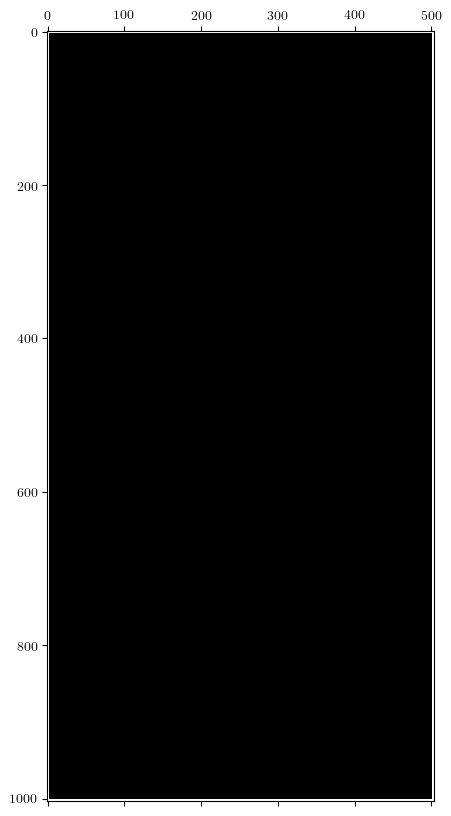

In [598]:
plt.spy(_inner_mask.reshape(nx+4,ny+4))

In [607]:
np.sum(_inner_mask.reshape(nx+4,ny+4)[:,:])

500000

In [614]:
pos_fin2 = pos_fin_[0,:,:].reshape(2,nx+4,ny+4)[:,_inner_mask.reshape(nx+4,ny+4)].reshape(2,nx*ny)

In [615]:
pos_fin2[:,25050].T

array([ 0.42839726,  0.2437364 ])

In [617]:
npos_a = np.load('newpos_a.npy')

In [618]:
npos_a.shape

(2, 500000)

In [620]:
npos_a[::-1,50050]

array([ 0.42839726,  0.2437364 ])

In [621]:
pos_fin_2d[:,100,250]

array([ 0.83555306,  0.24655567])

In [623]:
npos_a_2d = np.empty((2,500,1000))
npos_a_2d[0] = npos_a[0].reshape(ny,nx)
npos_a_2d[1] = npos_a[1].reshape(ny,nx)

In [624]:
npos_a_2d[::-1,250,100]

array([ 0.83555306,  0.24655567])

In [625]:
npos_a_2d_2 = np.empty((2,1000,500))
npos_a_2d_2[1] = npos_a_2d[0].T
npos_a_2d_2[0] = npos_a_2d[1].T

In [626]:
npos_a_2d_2[:,100,250]

array([ 0.83555306,  0.24655567])

In [691]:
indxs = []
npos_a_1d = np.trunc(npos_a_2d_2.reshape(2,nx*ny)*10**10)
pos_fin_1d = np.trunc(pos_fin_2d.reshape(2,nx*ny)*10**10)
for j in range(nx*ny):
    if not(npos_a_1d[1,j] == pos_fin_1d[1,j]) or not(npos_a_1d[0,j] == pos_fin_1d[0,j]):
        indxs.append(j)
    


In [692]:
npos_a_1d[:,0]

array([ 0.,  0.])

In [693]:
pos_fin_1d[:,0]

array([ 0.,  0.])

In [699]:
indxs[0]

1080

In [697]:
npos_a_2d_2.reshape(2,nx*ny)[:,indxs[0]][1]

0.5762686319000041

In [707]:
doublegyre_wrapper(0,np.array([0.75,0.75]).reshape(2,1))[0][0]

0.15707963267948966

In [708]:
doublegyre_wrapper(0,np.array([0.75,0.75]).reshape(2,1))[1][0]

-0.15707963267948966

In [698]:
pos_fin_2d.reshape(2,nx*ny)[:,indxs[0]][1]

0.57626863189999455

In [634]:
# Input: (numpy) array of coordinates, shape: (5,2,nx*ny), [grid,x,y]
def endpoints(t_start,t_end,pos_start,stride,integrator,rhs,n_proc,atol,rtol):
    pos_end = np.empty(pos_start.shape)
    
    n_tot = pos_start.shape[2]
    part = np.floor(n_tot/n_proc).astype(int)
    
    qlist = [mp.Queue() for j in range(n_proc)]
    
    if integrator.__name__ in fixed_step_integrators:
        plist = [mp.Process(target=_endpoints_fixed,
                           args=(t_start,t_end,pos_start[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part],
                                stride,integrator,rhs,j,qlist[j])) for j in range(n_proc)]
    else:
        plist = [mp.Process(target=_endpoints_adaptive,
                           args=(t_start,t_end,pos_start[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part],
                                stride,integrator,rhs,j,qlist[j],atol,rtol)) for j in range(n_proc)]
    
    for p in plist:
        p.start()
    for j, q in enumerate(qlist):
        pos_end[:,:,j*part:n_tot if j+1 is n_proc else (j+1)*part] = q.get()
    for p in plist:
        p.join()
    
    return pos_end

def _endpoints_fixed(t_start,t_end,pos_start,stride,integrator,rhs,pn,q):
    pos_fin = np.copy(pos_start)
    if t_end>t_start:
        for j in range(np.size(pos_fin,0)):
            t = np.copy(t_start).astype(float)
            h = np.copy(stride).astype(float)
            counter = 0
            while t<t_end:
                h = np.minimum(h,t_end-t)
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs)
                counter+=1
            print(h)
    else:
        for j in range(np.size(pos_fin,0)):
            t = np.copy(t_start).astype(float)
            h = np.copy(stride).astype(float)
            while t>t_end:
                h=np.sign(h)*np.minimum(np.abs(h),np.abs(t-t_end))
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs)
    q.put(pos_fin)
    
def _endpoints_adaptive(t_start,t_end,pos_start,stride,integrator,rhs,pn,q,atol,rtol):
    pos_fin = np.copy(pos_start)
    if t_end>t_start:
        for j in range(np.size(pos_fin,0)):
            t = np.ones(np.size(pos_fin[j]))*t_start
            h = np.ones(np.size(pos_fin[j]))*stride
            while np.any(t<t_end):
                h = np.minimum(h,t_end-t)
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs,atol,rtol)
    else:
        for j in range(np.size(pos_fin,0)):
            t = np.ones(np.size(pos_fin[j]))*t_start
            h = np.ones(np.size(pos_fin[j]))*stride
            while np.any(t>t_end):
                h = np.sign(h)*np.minimum(np.abs(h),np.abs(t-t_end))
                t,pos_fin[j],h = integrator(t,pos_fin[j],h,rhs,atol,rtol)
    q.put(pos_fin)

In [635]:
pos_fin = endpoints(t_start,t_end,np.array([grid,grid,grid,grid,grid]),h,integrator,doublegyre_wrapper,n_proc=4,atol=None,rtol=None)

200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200


In [636]:
pos_fin = pos_fin[0]

In [637]:
pos_fin.shape

(2, 500000)

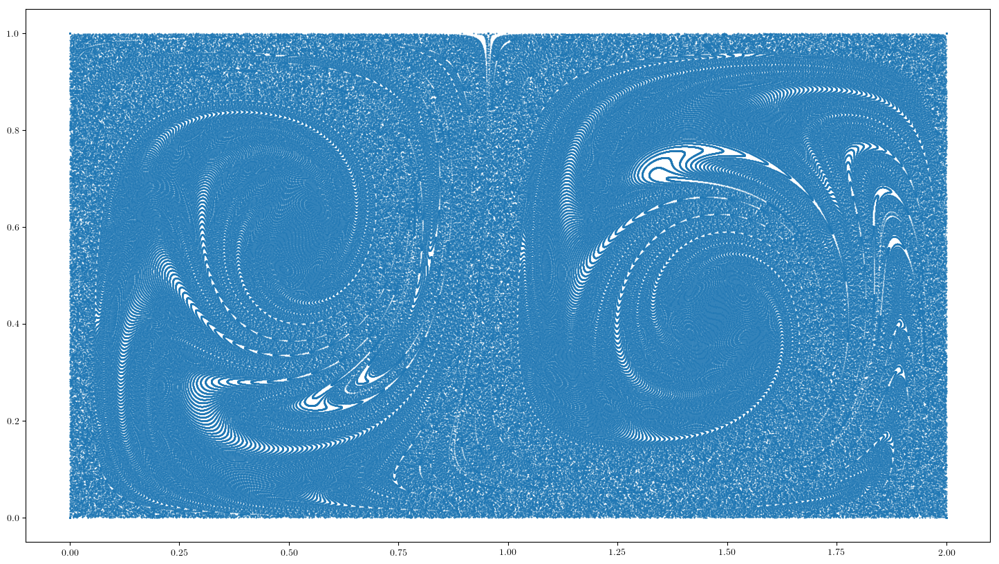

In [639]:
plt.scatter(pos_fin[0],pos_fin[1],s=1,marker='.')

In [724]:
foo,rel,bar = rk4(0,np.array([0.4,0.5]).reshape(2,1),0.1,doublegyre_wrapper)
for i in range(100):
    foo,rel,bar = rk4(0,rel,0.1,doublegyre_wrapper)

In [726]:
rel[0][0]

0.60133613949441422

In [727]:
grid.shape

(2, 500000)

In [728]:
grid_2D.shape

(2, 500, 1000)

In [729]:
grid_2D[:,100,150]

array([ 0.4004004,  0.3006012])

In [730]:
grid.shape

(2, 500000)

In [731]:
grid[:,500]

array([ 0.002002,  0.      ])

In [736]:
grid[:,::500][:,997][0]

1.9959959959959961